<a href="https://colab.research.google.com/github/JoaoCioffi/Machine_Learning/blob/main/Supervised_Learning/Classifiers/Classification_Systems.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Conceitos Introdutórios
---
> (i) Regressão Vs. Classificação
> - Regressão: prever um valor contínuo a partir de uma entrada de dados;
> - Classificação: prever a classe a partir de uma entrada de dados;
---
> (ii) Tipos de Classificação:
> - Classificação Binária;
> - Multiclassificação;
---
> (iii) Bias e Variância
>> 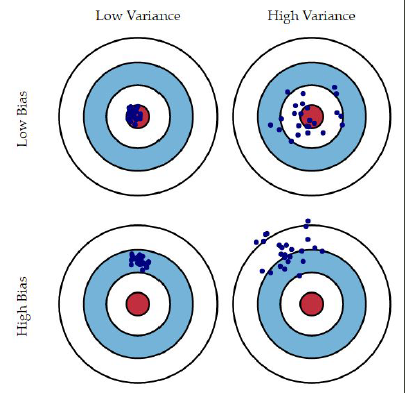

> O viés (Bias) é  a simplificação das suposições feitas pelo modelo para tornar a função de destino mais fácil de aproximar. Diferença entre o valor esperado da predição do nosso modelo (média das predições) e o valor real que queremos predizer
> A variância é o valor que a estimativa da função alvo mudará de acordo com os dados de treinamento diferentes. Ou seja, variabilidade das predições 
> Objetivo de um classificador é ter baixo viés e baixa variância



# Case: Thera Bank

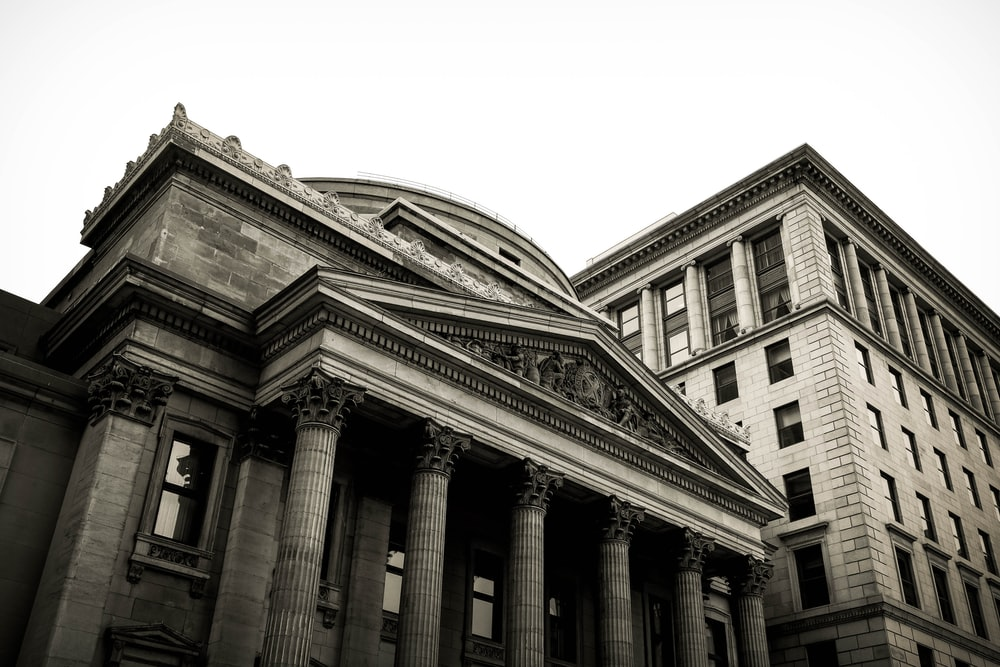

O Banco Thera Bank possui uma base de clientes crescente. A maioria desses clientes são passivos (depositantes) com depósitos de tamanhos variados. O número de clientes que também são devedores (clientes ativos) é bastante pequeno e o banco está interessado em expandir essa base rapidamente para trazer mais negócios de crédito e, no processo, ganhar mais com os juros dos empréstimos. Em particular, a administração deseja explorar maneiras de converter seus clientes passivos em clientes de empréstimos pessoais (enquanto os matém como depositantes). Uma campanha que o banco realizou no ano passado para clientes passivos mostrou uma taxa de conversão saudável de mais de 9% de sucesso. Isso encorajou o departamento de marketing de varejo a elaborar campanhas para melhor direcionar o marketing e aumentar a taxa de sucesso com um orçamento mínimo.

O departamento quer construir um modelo de classificação que os auxilie a identificar os clientes potenciais com maior probabilidade de adquirir o empréstimo. Isso aumentará a taxa de sucesso e, ao mesmo tempo, reduzirá o custo da campanha.

A base de dados histórica contém informações pessoais dos clientes e informações sobre produtos contratados. O arquivo também contém um dicionário das variáveis.

Arquivo: https://docs.google.com/spreadsheets/d/1XLC7jSBG7ElYSNDaHCEZ2V6YfZhWY5rH/edit#gid=640685944


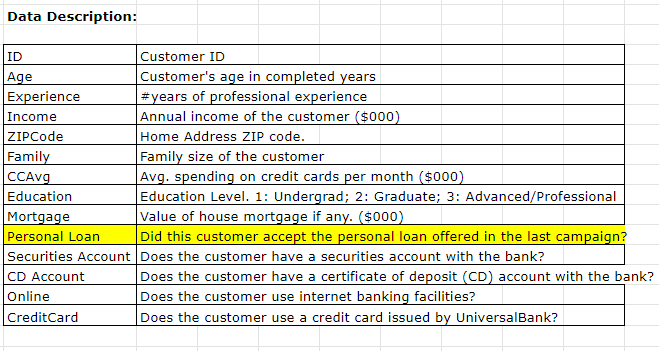

> Main Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

> Raw Data

In [ ]:
FILES = !ls
!echo $FILES

[sample_data  Thera_Bank.csv]


In [ ]:
FILES[0].split()[1]

'Thera_Bank.csv'

In [ ]:
df_raw = pd.read_csv(FILES[0].split()[1])
df_raw

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1.9,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


## 1- Loading Data

In [ ]:
df = df_raw.copy()
df.head()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


In [ ]:
df.isna().sum()

ID                    0
Age                   0
Experience            0
Income                0
ZIP Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal Loan         0
Securities Account    0
CD Account            0
Online                0
CreditCard            0
dtype: int64

In [ ]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIP Code            5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal Loan       5000 non-null   int64  
 10  Securities Account  5000 non-null   int64  
 11  CD Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


## 2- Exploratory Data Analysis (EDA)

### (i) Estatísticas Gerais

In [ ]:
df.drop(['ID','ZIP Code','Education','Personal Loan',\
         'Securities Account','CD Account', 'CreditCard','Online'], axis=1).describe(percentiles =[0.001,0.01,0.1,0.25,0.5,0.75,0.9,0.99,0.999])

,Age,Experience,Income,Family,CCAvg,Mortgage
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,45.338400,20.104600,73.774200,2.396400,1.937938,56.498800
std,11.463166,11.467954,46.033729,1.147663,1.747659,101.713802
min,23.000000,-3.000000,8.000000,1.000000,0.000000,0.000000
0.1%,23.000000,-2.000000,8.000000,1.000000,0.000000,0.000000
1%,25.000000,-1.000000,10.000000,1.000000,0.000000,0.000000
10%,30.000000,4.000000,22.000000,1.000000,0.300000,0.000000
25%,35.000000,10.000000,39.000000,1.000000,0.700000,0.000000
50%,45.000000,20.000000,64.000000,2.000000,1.500000,0.000000
75%,55.000000,30.000000,98.000000,3.000000,2.500000,101.000000


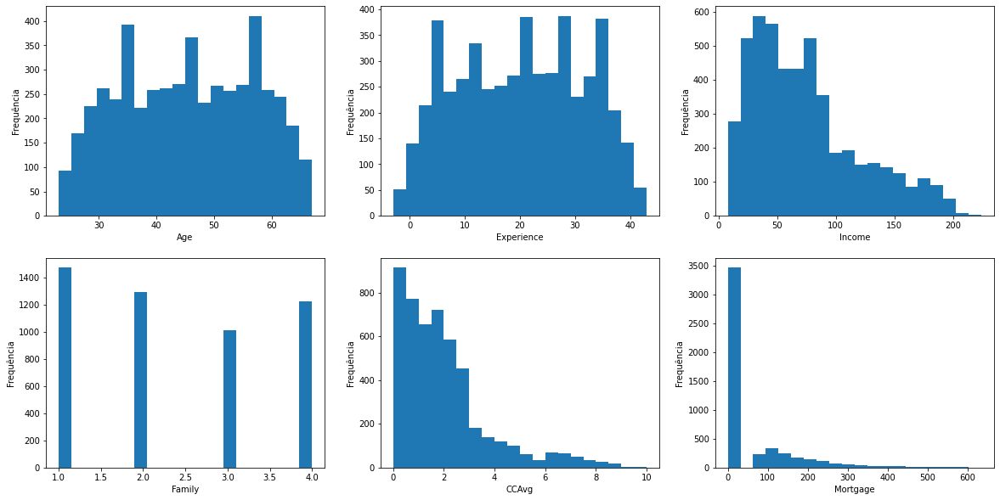

In [ ]:
contColNames = list(df.drop(['ID','ZIP Code','Education','Personal Loan',\
         'Securities Account','CD Account', 'CreditCard','Online'], axis=1).select_dtypes(include='number').columns) #-> seleciona apenas colunas numéricas
ncols = 3 #-> número de colunas que armazenarão os plots na figure 
nrows = int(np.ceil(len(contColNames)/(1.0 * ncols))) #-> número de linhas que armazenarão os plots na figure

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20,10))

counter = 0 

for i in range(nrows):
  for j in range(ncols):

    ax = axes[i][j]

    # Plotar somente quando houver dados
    if counter < len(contColNames):

      ax.hist(df.drop(['ID','ZIP Code','Education','Personal Loan',\
         'Securities Account','CD Account', 'CreditCard','Online'], axis=1).select_dtypes(include='number')[contColNames[counter]], bins=20)
      ax.set_xlabel(contColNames[counter])
      ax.set_ylabel('Frequência')

    else:
      ax.set_axis_off()

    counter += 1

plt.show()

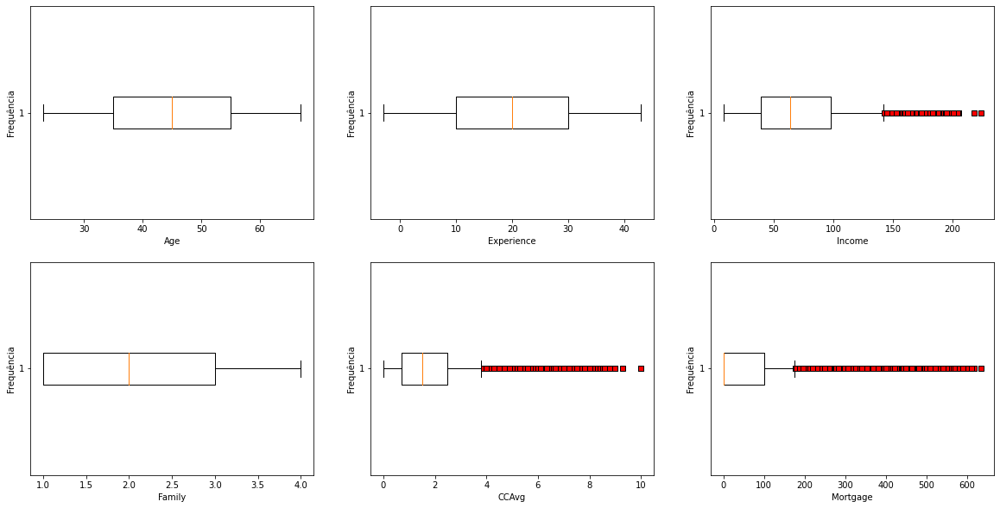

In [ ]:
contColNames = list(df.drop(['ID','ZIP Code','Education','Personal Loan',\
         'Securities Account','CD Account', 'CreditCard','Online'], axis=1).select_dtypes(include='number').columns) #-> seleciona apenas colunas numéricas
ncols = 3 #-> número de colunas que armazenarão os plots na figure 
nrows = int(np.ceil(len(contColNames)/(1.0 * ncols))) #-> número de linhas que armazenarão os plots na figure

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20,10))

counter = 0 

for i in range(nrows):
  for j in range(ncols):

    ax = axes[i][j]

    # Plotar somente quando houver dados
    if counter < len(contColNames):
      red_square = dict(markerfacecolor='r', marker='s')
      ax.boxplot(df.drop(['ID','ZIP Code','Education','Personal Loan',\
         'Securities Account','CD Account', 'CreditCard','Online'], axis=1).select_dtypes(include='number')[contColNames[counter]], flierprops=red_square, vert=False, whis=0.75)
      ax.set_xlabel(contColNames[counter])
      ax.set_ylabel('Frequência')

    else:
      ax.set_axis_off()

    counter += 1

plt.show()

In [ ]:
!pip install pandas-profiling==2.7.1 

     |████████████████████████████████| 252 kB 24.4 MB/s 
     |████████████████████████████████| 675 kB 63.5 MB/s 
     |████████████████████████████████| 58 kB 5.6 MB/s 
     |████████████████████████████████| 4.7 MB 41.4 MB/s 
     |████████████████████████████████| 812 kB 52.0 MB/s 
     |████████████████████████████████| 38.1 MB 1.3 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=e1506322f45c92b715a377fb9d06668a3068e018bff0d4c99b056c1d79aac848
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295206 sha256=7a7f7b7ed9d46d365558de52a245d9e2da3d208e91b587abc3cd33d70d3383ef
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built htmlmin imagehash
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalli

In [ ]:
# Rápida visão de dados através do relatório do pandas profile
from pandas_profiling import ProfileReport
profile = ProfileReport(df, minimal=True)
profile

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

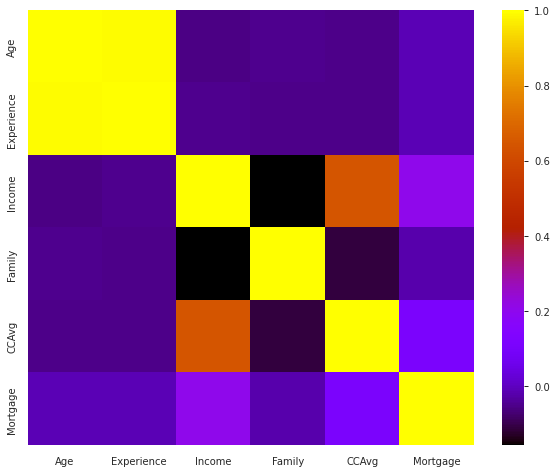

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(df.drop(['ID','ZIP Code','Education','Personal Loan',\
                     'Securities Account','CD Account','CreditCard','Online'], axis=1).corr(), annot=False, cmap='gnuplot')

### (ii) Feature Extraction

#### a) Distribuições por Idade (Box-Plot)

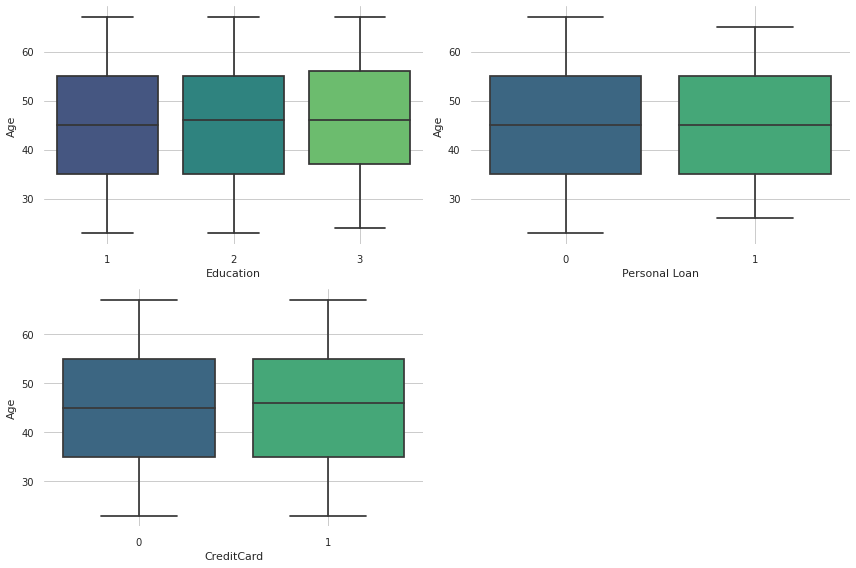

In [ ]:
ax = plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.boxplot(data=df, y="Age", x="Education", palette="viridis")
plt.grid(True)
plt.subplot(2,2,2)
sns.boxplot(data=df, y="Age", x="Personal Loan", palette="viridis")
plt.grid(True)
plt.subplot(2,2,3)
sns.boxplot(data=df, y = "Age", x="CreditCard", palette="viridis")
plt.grid(True)

plt.tight_layout()
plt.show()

#### b) Pairplot Geral

<Figure size 1440x864 with 0 Axes>

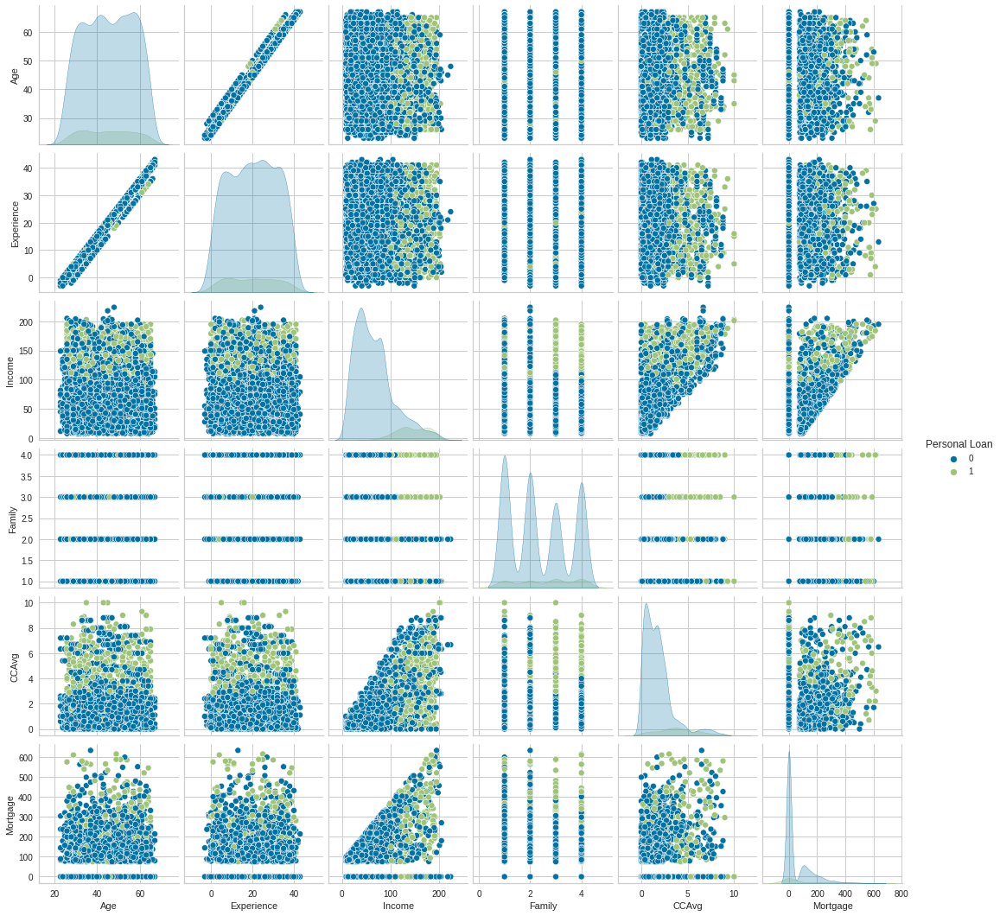

In [ ]:
plt.figure(figsize=(20,12))

sns.pairplot(df.drop(['ID','ZIP Code','Education',\
                      'Securities Account','CD Account','CreditCard','Online'], axis=1), hue='Personal Loan')

In [ ]:
fig =  px.scatter_3d(df, x='Age',y='Experience',z='Income',color='Personal Loan')
fig.show()

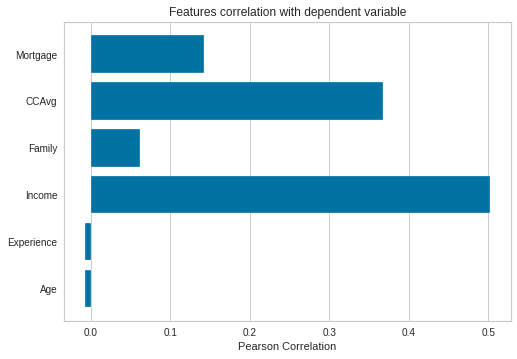

In [ ]:
from yellowbrick.target import FeatureCorrelation #doc: https://www.scikit-yb.org/en/latest/api/target/feature_correlation.html

#Visualizador de correlacao com o target
features = list(df.drop(['ID','ZIP Code','Education','Personal Loan',\
                         'Securities Account','CD Account','CreditCard','Online'], axis=1).select_dtypes(include='number').columns)
visualizer = FeatureCorrelation(labels=features)
visualizer.fit(df.drop(['ID','ZIP Code','Education','Personal Loan',\
                        'Securities Account','CD Account','CreditCard','Online'], axis=1), df['Personal Loan'])        
visualizer.show()

#### c) Zip Code Analysis

In [ ]:
!pip install pgeocode

In [ ]:
import pgeocode

nomi = pgeocode.Nominatim('us')
nomi.query_postal_code("91107")

postal_code             91107
country_code               US
place_name           Pasadena
state_name         California
state_code                 CA
county_name       Los Angeles
county_code              37.0
community_name           None
community_code            NaN
latitude               34.151
longitude           -118.0889
accuracy                  4.0
Name: 0, dtype: object

In [ ]:
df_geographical_features = df.groupby(by='ZIP Code').agg({'Experience':['min','max','mean'],'Age':['min','max','mean'],
                                                          'Family':['min','max','mean'],'CCAvg':['min','max','mean'],
                                                          'Education':['min','max','mean'],'Mortgage':['min','max','mean']})
df_geographical_features

Experience                Age      ... Education           Mortgage              
                min max       mean min max  ...       max      mean      min  max     mean
ZIP Code                                    ...                                           
9307             25  25  25.000000  51  51  ...         3  3.000000        0    0    0.000
90005             8  35  16.400000  32  59  ...         3  1.600000        0   81   16.200
90007            19  35  29.166667  43  59  ...         3  1.333333        0  264   70.000
90009             2  41  24.125000  27  66  ...         3  1.750000        0   95   21.625
90011            16  37  26.333333  40  61  ...         3  2.000000        0  155   83.000
...             ...  ..        ...  ..  ..  ...       ...       ...      ...  ...      ...
96091             3  35  21.000000  28  61  ...         3  2.250000        0    0    0.000
96094             0  11   5.500000  26  37  ...         2  2.000000        0    0    0.000
96145            18  18  18.000000  43  43  ...         3  3.000000       96   96   96.000
96150             3  31  18.250000  27  56  ...         2  1.250000        0  294  122.500
96651             1  34  14.166667  26  59  ...         3  2.166667        0  123   38.500

[467 rows x 18 columns]

In [ ]:
df_geographical_features.index

Int64Index([ 9307, 90005, 90007, 90009, 90011, 90016, 90018, 90019, 90024,
            90025,
            ...
            95973, 96001, 96003, 96008, 96064, 96091, 96094, 96145, 96150,
            96651],
           dtype='int64', name='ZIP Code', length=467)

In [ ]:
zip_codes_list = list(df_geographical_features.index)
lat, lon, city, state  = [], [], [], []

for z in zip_codes_list:
  lat.append(nomi.query_postal_code(str(z)).latitude)
  lon.append(nomi.query_postal_code(str(z)).longitude)
  city.append(nomi.query_postal_code(str(z)).place_name)
  state.append(nomi.query_postal_code(str(z)).state_code)

In [ ]:
df_geographical_features['LAT'] = lat
df_geographical_features['LON'] = lon
df_geographical_features['City'] = city
df_geographical_features['State_Code'] = state

df_geographical_features

Experience                 ...       LON              City State_Code
                min max       mean  ...                                       
ZIP Code                            ...                                       
9307             25  25  25.000000  ...       NaN               NaN        NaN
90005             8  35  16.400000  ... -118.3012       Los Angeles         CA
90007            19  35  29.166667  ... -118.2871       Los Angeles         CA
90009             2  41  24.125000  ... -118.2437       Los Angeles         CA
90011            16  37  26.333333  ... -118.2582       Los Angeles         CA
...             ...  ..        ...  ...       ...               ...        ...
96091             3  35  21.000000  ... -122.7239    Trinity Center         CA
96094             0  11   5.500000  ... -122.3861              Weed         CA
96145            18  18  18.000000  ... -120.1445        Tahoe City         CA
96150             3  31  18.250000  ... -119.9865  South Lake Tahoe         CA
96651             1  34  14.166667  ...       NaN               NaN        NaN

[467 rows x 22 columns]

In [ ]:
df_geographical_features.columns = ['_'.join(col).strip() if col[1] != "" else col[0] for col in df_geographical_features.columns.values]

df_geographical_features.head()

,Experience_min,Experience_max,Experience_mean,Age_min,Age_max,Age_mean,Family_min,Family_max,Family_mean,CCAvg_min,CCAvg_max,CCAvg_mean,Education_min,Education_max,Education_mean,Mortgage_min,Mortgage_max,Mortgage_mean,LAT,LON,City,State_Code
ZIP Code,,,,,,,,,,,,,,,,,,,,,,
9307,25,25,25.000000,51,51,51.000000,4,4,4.000000,0.6,0.60,0.600000,3,3,3.000000,0,0,0.000,NaN,NaN,NaN,NaN
90005,8,35,16.400000,32,59,40.600000,1,4,2.400000,0.3,4.33,1.926000,1,3,1.600000,0,81,16.200,34.0585,-118.3012,Los Angeles,CA
90007,19,35,29.166667,43,59,53.833333,1,4,2.833333,0.3,7.40,2.666667,1,3,1.333333,0,264,70.000,34.0294,-118.2871,Los Angeles,CA
90009,2,41,24.125000,27,66,49.125000,1,4,2.625000,0.4,3.60,2.150000,1,3,1.750000,0,95,21.625,34.0522,-118.2437,Los Angeles,CA
90011,16,37,26.333333,40,61,51.000000,1,4,2.666667,0.4,1.40,0.866667,1,3,2.000000,0,155,83.000,34.0079,-118.2582,Los Angeles,CA


In [ ]:
df_cities = df_geographical_features.groupby(by='City').agg({'Experience_mean':'mean',
                                                             'Age_mean':'mean',
                                                             'Family_mean':'mean',
                                                             'CCAvg_mean':'mean',
                                                             'Education_mean':'mean',
                                                             'Mortgage_mean':'mean'})
df_cities

,Experience_mean,Age_mean,Family_mean,CCAvg_mean,Education_mean,Mortgage_mean
City,,,,,,
Agoura Hills,21.166667,46.500000,2.500000,1.066667,1.833333,20.000000
Alameda,17.346154,42.769231,2.692308,1.897308,2.153846,44.653846
Alamo,21.000000,45.500000,1.000000,2.450000,1.000000,203.000000
Albany,19.200000,44.500000,2.700000,1.520000,1.800000,15.100000
Alhambra,20.000000,46.000000,1.333333,3.823333,1.666667,117.666667
...,...,...,...,...,...,...
Westlake Village,20.000000,45.000000,2.250000,1.575000,1.500000,90.250000
Whittier,11.000000,36.250000,3.000000,2.025000,2.000000,29.750000
Woodland Hills,20.750000,45.750000,2.500000,2.625000,1.750000,6.916667


## 3- Supervised Learning: Classification System

Antes de Prosseguirmos para o modelo, é importante fazermos uma breve introdução às métricas de avaliação de um algoritmo de classificação.

A avaliação de um modelo classificador é feita a partir da comparação entre as classes preditas pelo modelo e as classes verdadeiras de cada exemplo

1. Matriz de Confusão
  - Classificação binária;
  - Verdadeiros positivos e negativos;
  - Falsos positivos e negativos;

  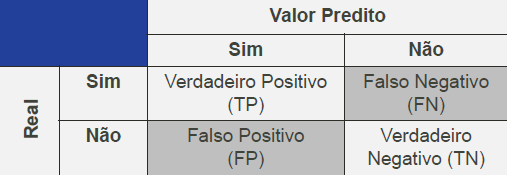

2. Acurácia (Accuracy)
  - Percentual de classificações corretas, independente da classe;
  - Apesar de ser uma métrica simples e bastante interpretável, é sensível ao desbalanceamento entre classes;
  - Atribui o mesmo peso para ambos os erros

  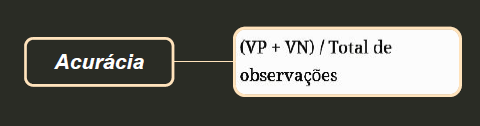


3. Precisão (Precision)
  - Percentual de classificações positivas que estão corretas;
  - Maior ênfase para os erros por falso positivo;

  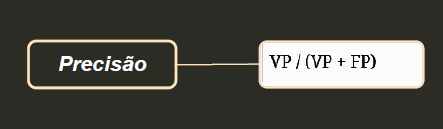

4. Revocação (Recall)
  - Maior ênfase para erros por falso negativo;

  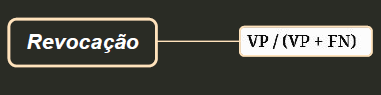

5. F-Score:
  - Combinação entre recall e precision;

  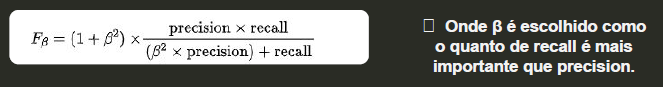

6. F1-Score
  - Frequentemente utilizado;
  - Média harmônica entre recall e precision;
  - F1-Score tende a ser um resumo melhor da qualidade do modelo

  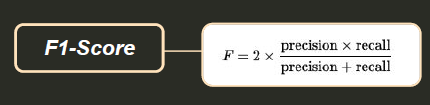

7. ROC (Receiver Operating Characteristic)
   - A curva ROC pode ser utilizada para avaliar a performance de um classificador para diferentes limiares de classificação;
   - Mostra o desempenho do classificador exibindo a taxa de verdadeiros positivos e a taxa de falsos positivos para diferen tes valores de corte

   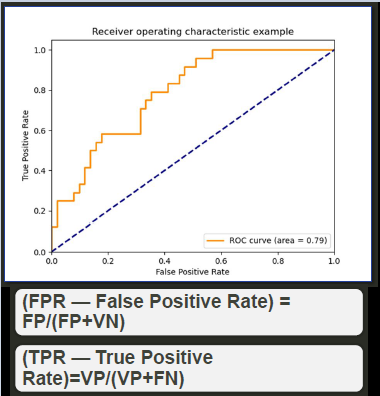

  - Como regra geral, o gráfico deve ir da direção ao canto superior esquerdo;
  - A diagonal mostra o comportamento de um classificador com classificações randômicas;
  - **AUC (Area Under Curve)**: possui um valor entre 0 e 1 - quanto mais próximo de 1, maior é a performance do modelo;

### (i) Separando variáveis X e y

In [ ]:
# Relembrando os dados
df.head(3)

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0


#### a) Variáveis regressoras (X)

> Selecionando Features

In [ ]:
X = df.drop(['ID','ZIP Code','Personal Loan'], axis=1)
X.head()

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard
0,25,1,49,4,1.6,1,0,1,0,0,0
1,45,19,34,3,1.5,1,0,1,0,0,0
2,39,15,11,1,1.0,1,0,0,0,0,0
3,35,9,100,1,2.7,2,0,0,0,0,0
4,35,8,45,4,1.0,2,0,0,0,0,1


#### b) Variável Target/Resposta (y)

> Selecionando o target

In [ ]:
y = df['Personal Loan']
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Personal Loan, dtype: int64

#### c) Train/Test Data

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print('X_train', X_train.shape)
print('y_train', y_train.shape)
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (3750, 11)
y_train (3750,)
X_test (1250, 11)
y_test (1250,)


#### d) Normalização de X

In [ ]:
# Normalização das variáveis
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Transformando em dataframe para visualização
X_train = pd.DataFrame(X_train_scaled,columns = X_train.columns)
X_test = pd.DataFrame(X_test_scaled,columns = X_test.columns)

print(X_train.head(),'\n\n',X_test.head())

        Age  Experience    Income  ...  CD Account  Online  CreditCard
0  0.840909    0.804348  0.194444  ...         0.0     1.0         1.0
1  0.636364    0.652174  0.203704  ...         0.0     0.0         0.0
2  0.250000    0.282609  0.379630  ...         0.0     1.0         0.0
3  0.613636    0.565217  0.032407  ...         0.0     0.0         0.0
4  0.500000    0.500000  0.236111  ...         1.0     1.0         0.0

[5 rows x 11 columns] 

         Age  Experience    Income  ...  CD Account  Online  CreditCard
0  0.159091    0.152174  0.125000  ...         0.0     0.0         1.0
1  0.545455    0.565217  0.652778  ...         0.0     0.0         1.0
2  0.159091    0.173913  0.523148  ...         0.0     1.0         0.0
3  0.181818    0.195652  0.250000  ...         0.0     1.0         0.0
4  0.886364    0.847826  0.101852  ...         0.0     1.0         0.0

[5 rows x 11 columns]


#### e) Teste de Normalidade (Kolmogorov) em y

> * Resposta Original

Estatística do teste: 0.5
P-Value: 0.0




/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


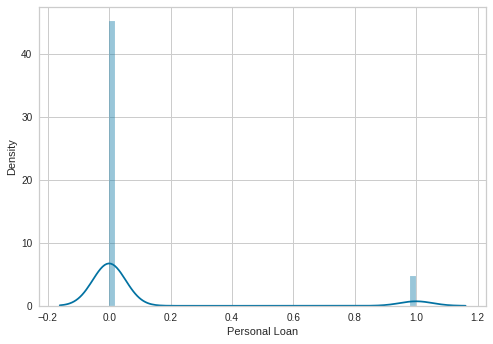

In [ ]:
import scipy as sp

kStat, kPvalue = sp.stats.kstest(rvs=y, cdf='norm') #cdf: cumulative distribution function ; <https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kstest.html

print(f'Estatística do teste: {kStat}\nP-Value: {kPvalue}\n\n')

fig = plt.figure()
sns.distplot(y)

#### f) Análise VIF (Variance Inflation Factor)

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Variance of Inflation
pd.DataFrame({
            'variables': X_train.columns[1:],
            'VIF': [variance_inflation_factor(X_train.values, i+1) for i in range(len(X_train.columns[1:]))]
            })

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


,variables,VIF
0,Experience,430.790352
1,Income,5.040407
2,Family,2.133560
3,CCAvg,3.750670
4,Education,1.979305
5,Mortgage,1.379329
6,Securities Account,1.244896
7,CD Account,1.351022
8,Online,2.294575
9,CreditCard,1.498844


### (ii) Modelos e Técnicas de Classificação

#### a) K-Nearest Neighbors (KNN)

Características Gerais:

- Aprendizado baseado em distância: o algoritmo classifica um dado ponto através dos "K-vizinhos" mais próximos a ele;
- É tido como um "lazy algorythm": simplicidade de implementação e de treinamento;
- Não paramétrico: a distância é suficiente para fazer a inferência, não necessitando de cálculo de parâmetros para a aprendizagem;
- Pode ser computacionalmente custoso se a base tiver muitas dimensões;

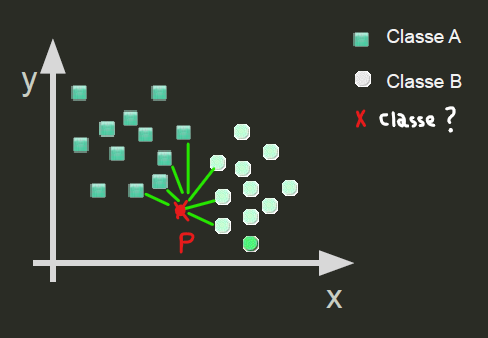


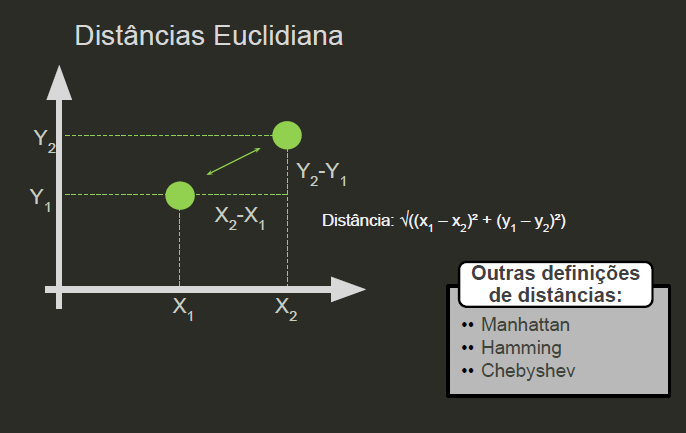


> Iteração para encontrar o melhor K

In [ ]:
from sklearn.neighbors import KNeighborsClassifier #https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
from sklearn.metrics import accuracy_score

scores_list = []
K_neighbors = range(1, 101)

for k in K_neighbors:
  knn = KNeighborsClassifier(n_neighbors=k)
  knn.fit(X_train, y_train)
  y_pred = knn.predict(X_test)
  scores_list.append(accuracy_score(y_test, y_pred))

Text(0, 0.5, 'Acuracia')

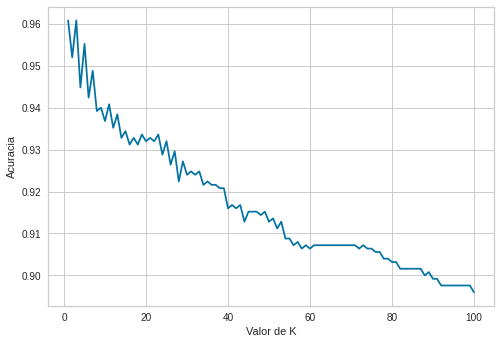

In [ ]:
plt.plot(K_neighbors, scores_list, '-b')
plt.xlabel("Valor de K")
plt.ylabel("Acuracia")

Como podemos observar, na medida em que aumentamos o número de K o algoritmo vai perdendo resolução na sua capacidade preditiva. Portanto para uma primeira abordagem iremos manter `K=3` e tirar as demais métricas com isso

> K específico

In [ ]:
clf_knn = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
clf_knn.fit(X_train, y_train)

KNeighborsClassifier(n_jobs=-1, n_neighbors=3)

In [ ]:
y_pred = clf_knn.predict(X_test)
y_pred

array([0, 1, 0, ..., 0, 0, 0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0e3de4ad90>,
      dtype=object)

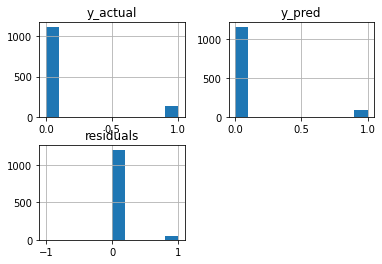

In [ ]:
pd.DataFrame({'y_actual':y_test,
              'y_pred':y_pred,
              'residuals':y_test - y_pred}).hist()

In [ ]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report

f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

metricas = {}
metricas["KNN"]={"accuracy":accuracy,
                 "precision":precision,
                 "recall":recall,
                 "f1":f1}

F1 Score: 87.94%
Accuracy Score: 96.08%
Precision Score: 97.75%
Recall Score: 64.93%


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


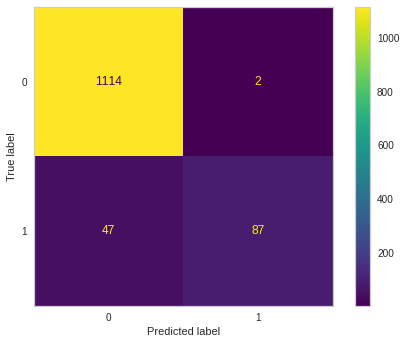

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf_knn, X_test, y_test, values_format='d')  
plt.grid(False)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1116
           1       0.98      0.65      0.78       134

    accuracy                           0.96      1250
   macro avg       0.97      0.82      0.88      1250
weighted avg       0.96      0.96      0.96      1250



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


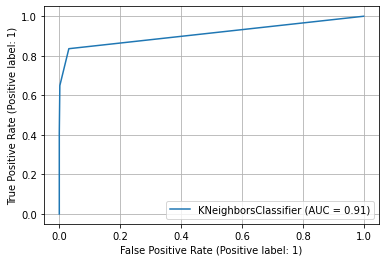

In [ ]:
from sklearn.metrics import plot_roc_curve

# Curva ROC
plot_roc_curve(clf_knn, X_test, y_test)  
plt.grid(True)
plt.show()

#### b) Regressão Logística

Características Gerais:
- Perfroma muito bem em dados linearmente separáveis;
- Utiliza o método da máxima verossimilhança;
- Facilidade na interpretação das probabilidades;
- Fornece resultados em termos de probabilidade;
- Facilidade de classificação de indivíduos em categorias;
- Base para redes neurais artificiais;
- Regressão Linear:
  - Modelo de Regressão Linear:

    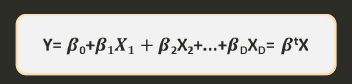

  - Onde `X^t = [1,X_1,X_2,...,X_d]` e Y é um valor binário;
  - Se considerarmos a saída Y como um valor inteiro, podemos usar o modelo de regressão para realizarmos a classificação dos dados;
- Utiliza a função sigmoide:

  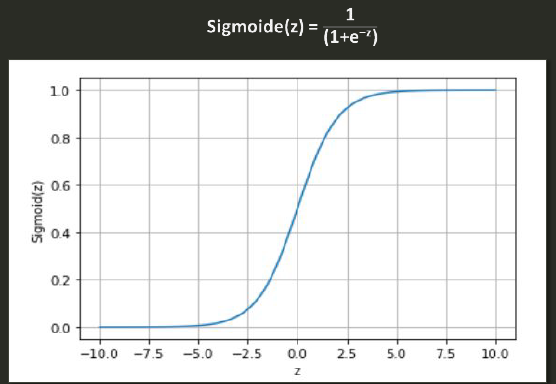

  - As probabilidades de uma classificação binária:

  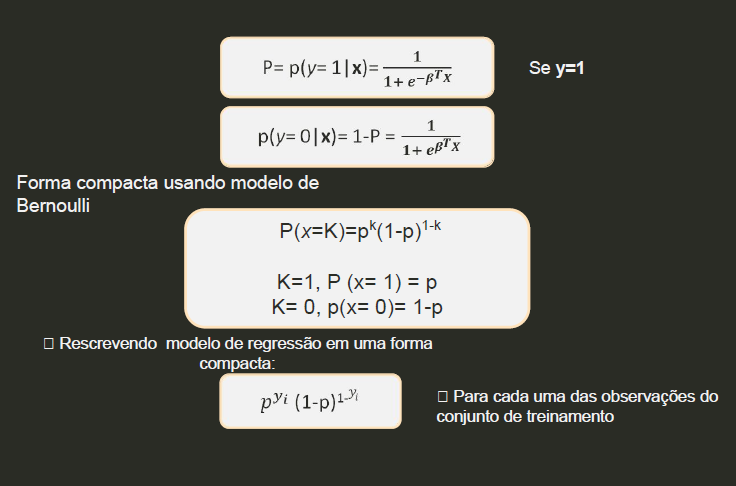

  - Usando a Função de Verossimilhança (ou Likelihood):
  
  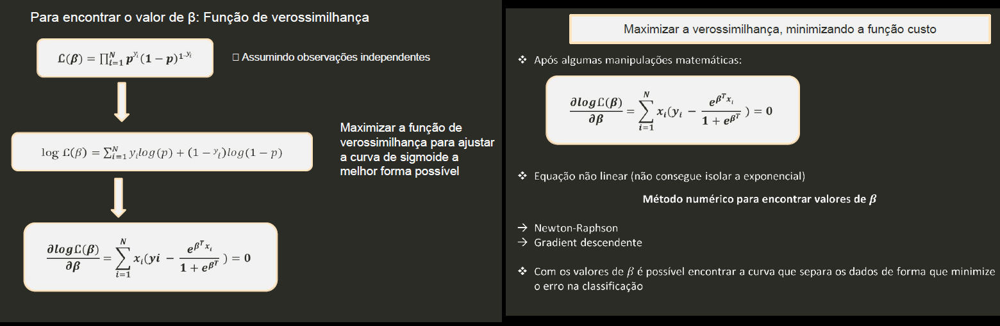



> Grid Search para encontrar o melhor modelo

In [ ]:
from sklearn.model_selection import GridSearchCV

params_grid = {
          'C':(0.01, 1, 10, 100), 
          'penalty':('l1','l2','elasticnet'),
          'solver': ('newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'),
          'multi_class':('auto','ovr','multinomial')
}

In [ ]:
from sklearn.linear_model import  LogisticRegression #https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
# Create a based model
clf_logistic = LogisticRegression()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=clf_logistic, param_grid=params_grid, n_jobs=-1, cv=3, verbose=0)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
312 fits failed out of a total of 540.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
36 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py", line 449, in _check_solver
    % (solver, penalty)
ValueError: Solv

GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': (0.01, 1, 10, 100),
                         'multi_class': ('auto', 'ovr', 'multinomial'),
                         'penalty': ('l1', 'l2', 'elasticnet'),
                         'solver': ('newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga')})

In [ ]:
print(grid_search.best_params_)
print(grid_search.best_estimator_)

{'C': 10, 'multi_class': 'auto', 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=10, solver='liblinear')


> Modelo Específico

In [ ]:
clf_logistic = LogisticRegression(C=10,solver='liblinear',
                                  penalty='l2',multi_class='auto')
clf_logistic.fit(X_train,y_train)

LogisticRegression(C=10, solver='liblinear')

In [ ]:
y_pred = clf_logistic.predict(X_test)
y_pred

array([0, 0, 0, ..., 1, 0, 0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0e3d79c790>,
      dtype=object)

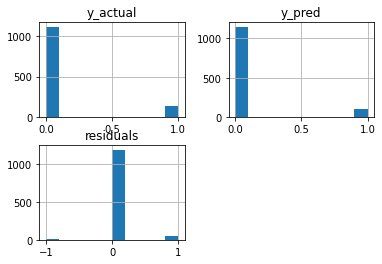

In [ ]:
pd.DataFrame({'y_actual':y_test,
              'y_pred':y_pred,
              'residuals':y_test - y_pred}).hist()

In [ ]:
f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

metricas["Logistic_Regression"]={"accuracy":accuracy,
                                 "precision":precision,
                                 "recall":recall,
                                 "f1":f1}

F1 Score: 85.5%
Accuracy Score: 95.04%
Precision Score: 85.29%
Recall Score: 64.93%


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


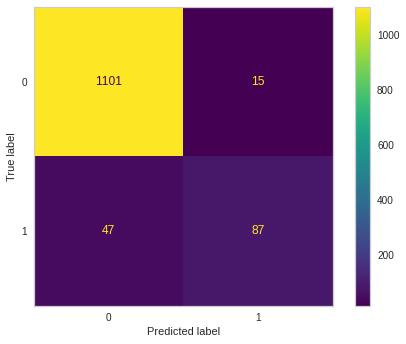

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf_logistic, X_test, y_test, values_format='d')  
plt.grid(False)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      1116
           1       0.85      0.65      0.74       134

    accuracy                           0.95      1250
   macro avg       0.91      0.82      0.85      1250
weighted avg       0.95      0.95      0.95      1250



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


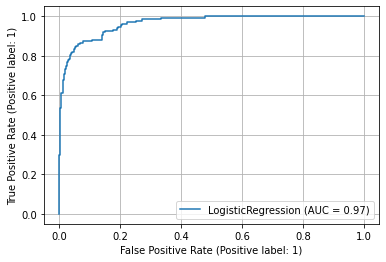

In [ ]:
from sklearn.metrics import plot_roc_curve

# Curva ROC
plot_roc_curve(clf_logistic, X_test, y_test)  
plt.grid(True)
plt.show()

#### c) Naive Bayes

Características Gerais:
- Abordagem probabilística;
- Baseado em evidências;
- Treinamento rápido;
- Assume que as features são independentes;
- Boa performance para classificação de textos;

1. Pensamento Bayesiano e Probabilidade:

  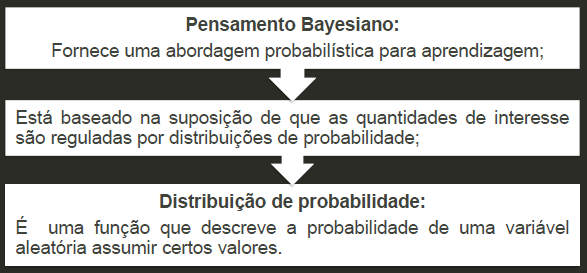

  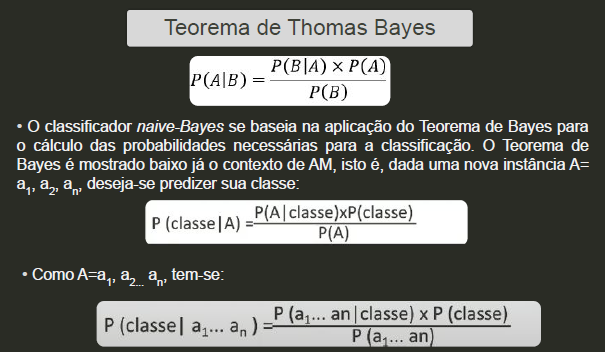

  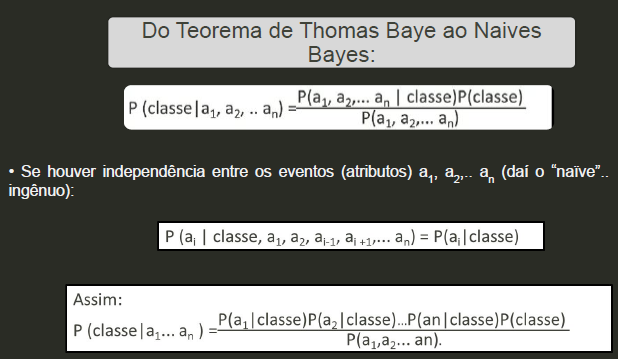

  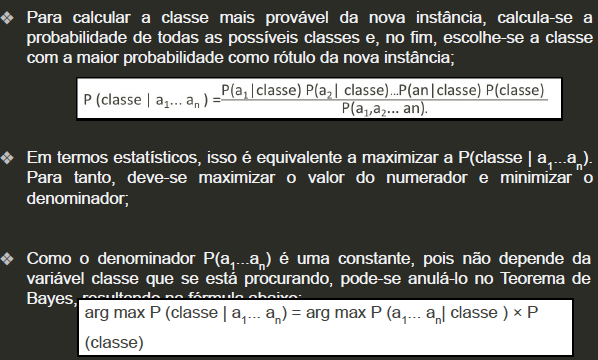

  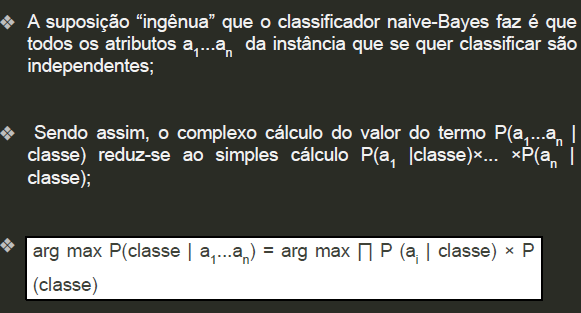

2. Variações de Naive Bayes:
  - **Gaussian NB:** distribuição contínua e normalmente distribuída;
  - **Multinomial NB:** valores discretos;
  - **Bernoulli NB:** distribuição de Bernoulli (valores binários);

> Grid Search para encontrar o melhor modelo

Neste caso não existe a possibilidade de performar o Grid Search sobre um algoritmo Naive Bayes, então iremos simplesmente carregar o modelo 

(https://stats.stackexchange.com/questions/299842/why-grid-search-is-not-performed-for-naive-bayes-classifier/299843)

In [ ]:
from sklearn.naive_bayes import GaussianNB #https://scikit-learn.org/stable/modules/naive_bayes.html  --> Naive Bayes Geral
                                           #https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#sklearn.naive_bayes.GaussianNB --> Gaussian Naive Bayes

# Create a based model
clf_Naive = GaussianNB()

# Fit the grid search to the data
clf_Naive.fit(X_train, y_train)

GaussianNB()

In [ ]:
y_pred = clf_Naive.predict(X_test)
y_pred

array([0, 1, 1, ..., 1, 1, 0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0e354e4150>,
      dtype=object)

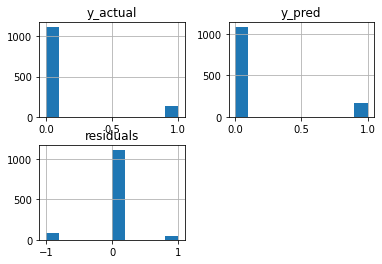

In [ ]:
pd.DataFrame({'y_actual':y_test,
              'y_pred':y_pred,
              'residuals':y_test - y_pred}).hist()

In [ ]:
f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

metricas["Gaussian_NB"]={"accuracy":accuracy,
                         "precision":precision,
                         "recall":recall,
                         "f1":f1}

F1 Score: 74.51%
Accuracy Score: 89.2%
Precision Score: 49.7%
Recall Score: 61.94%


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


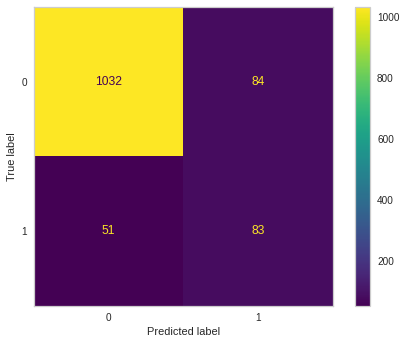

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf_Naive, X_test, y_test, values_format='d')  
plt.grid(False)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.92      0.94      1116
           1       0.50      0.62      0.55       134

    accuracy                           0.89      1250
   macro avg       0.72      0.77      0.75      1250
weighted avg       0.90      0.89      0.90      1250



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


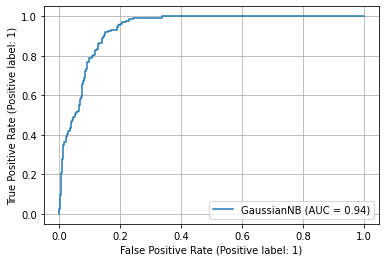

In [ ]:
from sklearn.metrics import plot_roc_curve

# Curva ROC
plot_roc_curve(clf_Naive, X_test, y_test)  
plt.grid(True)
plt.show()

#### d) Decision Tree

Características Gerais:

- Facilidade na interpretação dos resultados e de importância dos atributos;
- Sem necessidade de normalizar os dados de entrada;
- Podagem é uma boa técnica para deixar a estrutura da árvore mais simples e evitar overfitting do modelo;
- Instável/Sensível: pequenas mudanças na base de treinamento pode acarretar em grandes mudanças na resposta;

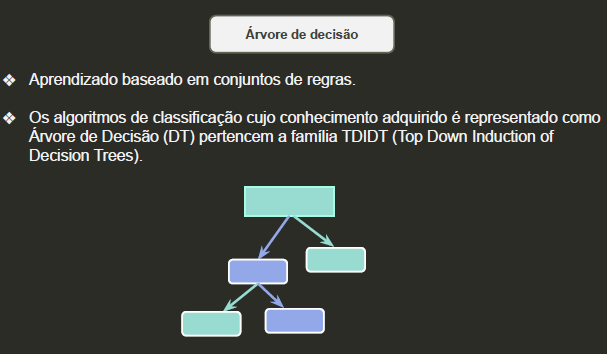

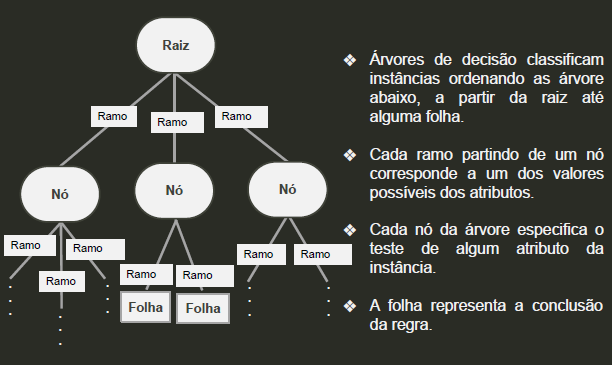

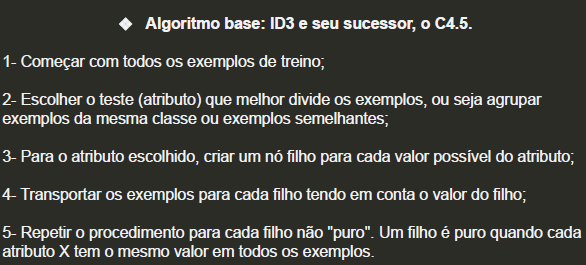

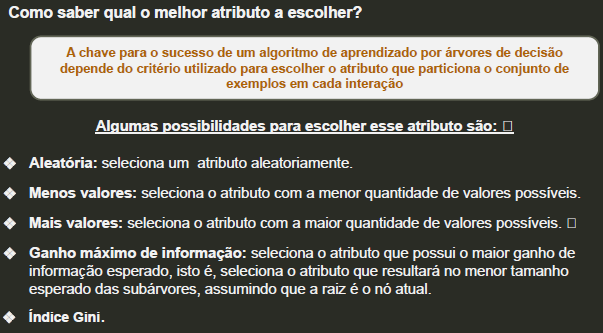

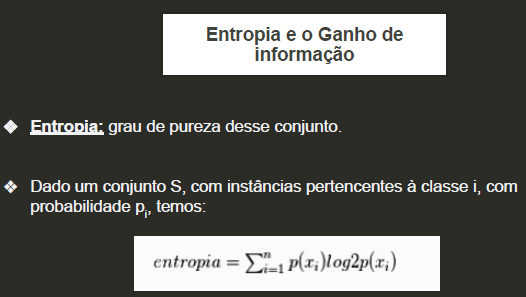

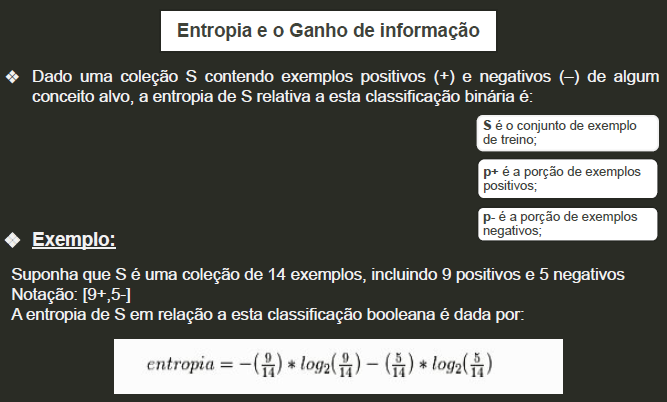


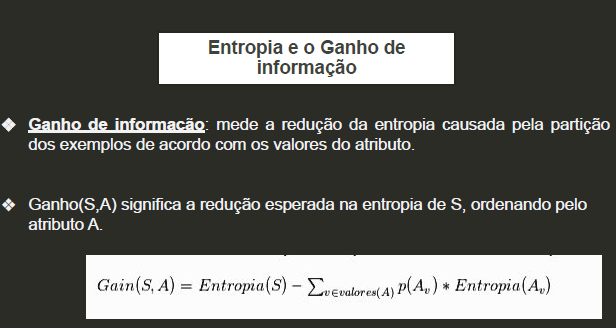


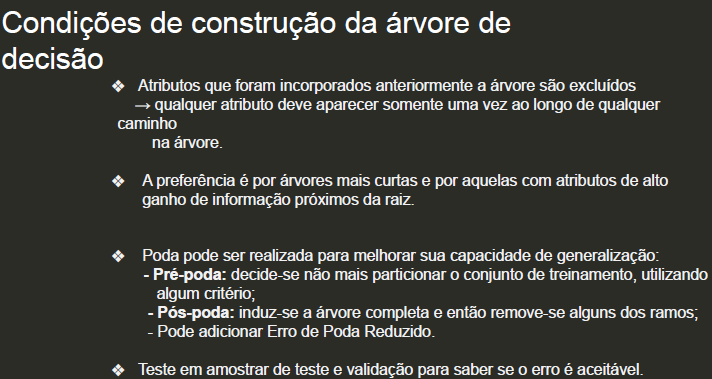

> Grid Search para encontrar o melhor modelo

In [ ]:
params_grid = {
          'criterion':('gini','entropy'),
          'max_depth':(None,1,5,10,25,50,75,100),
          'min_samples_split':(1,2,5,10),
          'min_samples_leaf':(1,2,5,10),
          'min_weight_fraction_leaf':(0.,0.25,0.5,0.75,1.),
          'max_features':(None,'auto','sqrt','log2'),
          'max_leaf_nodes':(1,2,5,10),
          'ccp_alpha':(0.,0.25,0.5,0.75,1.)
          }

In [ ]:
from sklearn.tree import DecisionTreeClassifier #https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html
# Create a based model
clf_DecisionTree = DecisionTreeClassifier()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=clf_DecisionTree, param_grid=params_grid, n_jobs=-1, cv=3, verbose=0)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
203520 fits failed out of a total of 307200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
76800 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py", line 942, in fit
    X_idx_sorted=X_idx_sorted,
  File "/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py", line 254, in fit
    % self.min_samples_split
ValueError: min_samples_split must be an integer greater than 1 o

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'ccp_alpha': (0.0, 0.25, 0.5, 0.75, 1.0),
                         'criterion': ('gini', 'entropy'),
                         'max_depth': (None, 1, 5, 10, 25, 50, 75, 100),
                         'max_features': (None, 'auto', 'sqrt', 'log2'),
                         'max_leaf_nodes': (1, 2, 5, 10),
                         'min_samples_leaf': (1, 2, 5, 10),
                         'min_samples_split': (1, 2, 5, 10),
                         'min_weight_fraction_leaf': (0.0, 0.25, 0.5, 0.75,
                                                      1.0)})

In [ ]:
print(grid_search.best_params_)
print(grid_search.best_estimator_)

{'ccp_alpha': 0.0, 'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': 10, 'min_samples_leaf': 10, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0}
DecisionTreeClassifier(criterion='entropy', max_leaf_nodes=10,
                       min_samples_leaf=10)


> Modelo Específico

In [ ]:
clf_DecisionTree = DecisionTreeClassifier(criterion='entropy', max_leaf_nodes=10, min_samples_leaf=10, min_samples_split=2)
clf_DecisionTree.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_leaf_nodes=10,
                       min_samples_leaf=10)

>> Vizualização da Árvore

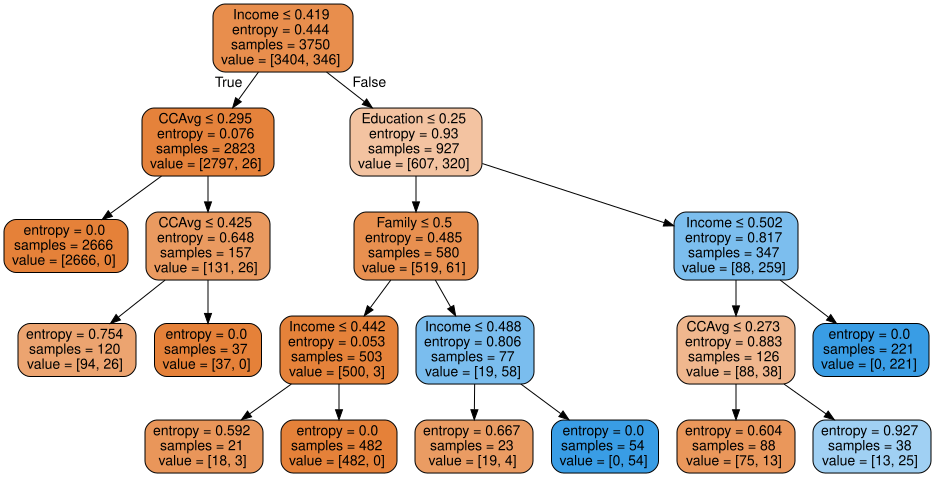

In [ ]:
from sklearn.tree import export_graphviz
import graphviz
dot_data = export_graphviz(clf_DecisionTree,
                     feature_names=X.columns,
                     filled=True, rounded=True,special_characters=True) 

graph = graphviz.Source(dot_data)  
graph  

In [ ]:
!pip install dtreeviz==1.2

     |████████████████████████████████| 54 kB 2.1 MB/s 
  Created wheel for dtreeviz: filename=dtreeviz-1.2-py3-none-any.whl size=60008 sha256=e3d4280d45c08e94ed341ea24594a2020c51da8feca67eb71ec9abf6312b46b0
  Stored in directory: /root/.cache/pip/wheels/e1/a0/1f/6541f2bcdf04d5891f5c614c7575e2db65c03eff2fb2ad9f2a
Successfully built dtreeviz


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


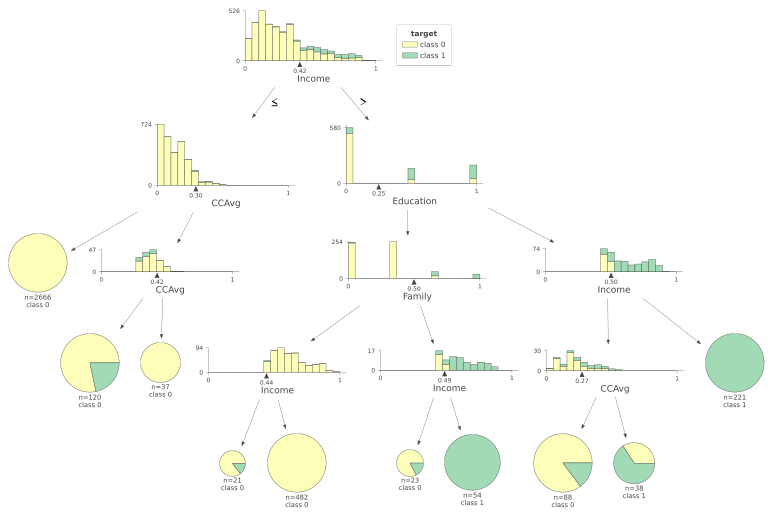

In [ ]:
from dtreeviz.trees import *
viz = dtreeviz(clf_DecisionTree, 
               X_train.values, 
               y_train.values,
               target_name='target',
               feature_names=X_train.columns,
               histtype= 'barstacked')  
viz

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


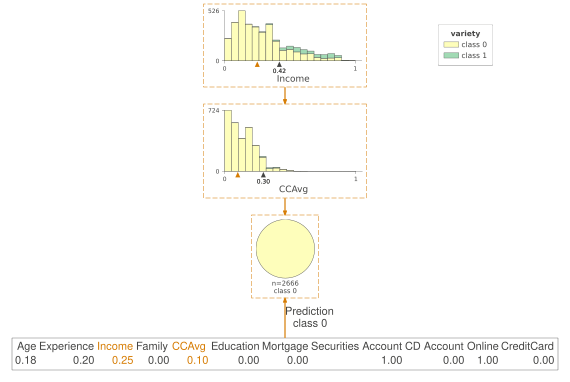

In [ ]:
viz_pred = dtreeviz(clf_DecisionTree,
        X_train.values, 
        y_train.values, 
        target_name='variety', 
        orientation ='TD',  
        feature_names=X_train.columns,
        X=X_test.iloc[[3]].values[0], # Single observation for prediction
        show_just_path=True     
        )
viz_pred

In [ ]:
y_pred = clf_DecisionTree.predict(X_test)
y_pred

array([0, 1, 0, ..., 0, 0, 0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0e34567c50>,
      dtype=object)

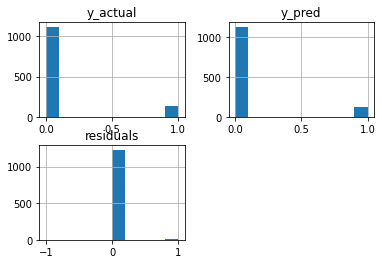

In [ ]:
pd.DataFrame({'y_actual':y_test,
              'y_pred':y_pred,
              'residuals':y_test - y_pred}).hist()

In [ ]:
f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

metricas["Decision_Tree"]={"accuracy":accuracy,
                           "precision":precision,
                           "recall":recall,
                           "f1":f1}

F1 Score: 95.85%
Accuracy Score: 98.48%
Precision Score: 97.52%
Recall Score: 88.06%


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


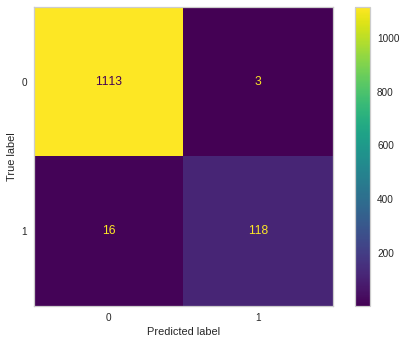

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf_DecisionTree, X_test, y_test, values_format='d')  
plt.grid(False)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1116
           1       0.98      0.88      0.93       134

    accuracy                           0.98      1250
   macro avg       0.98      0.94      0.96      1250
weighted avg       0.98      0.98      0.98      1250



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


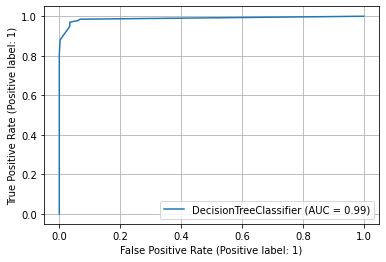

In [ ]:
from sklearn.metrics import plot_roc_curve

# Curva ROC
plot_roc_curve(clf_DecisionTree, X_test, y_test)  
plt.grid(True)
plt.show()

#### e) Random Forest e Gradient Boosting

Características Gerais:

- Random Forest e Gradient Boosting são ensembles das árvores de decisão;
- Ensemble Learning é uma poderosa técnica de aprendizagem e bastante interpretável;
- Performance bem relevante entre os algoritmos mais atuais (state-of-the-art);
- Assim como acontece com as árvores isoladas, os algoritmos de Random Forest carregam a instabilidade/sensibilidade das mudanças na base de dados, isto é, podem alterar suas estruturas com as mudanças mencionadas;
- Uma vantagem quando comparados às árvores isoladas é que tanto a Random Forest quanto o Gradient Boosting procuram minimizar o problema de overfitting


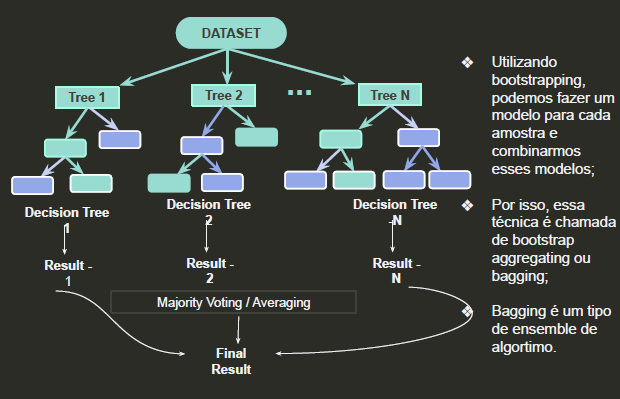

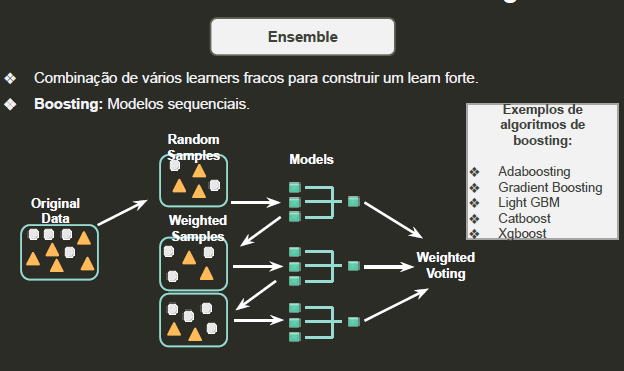

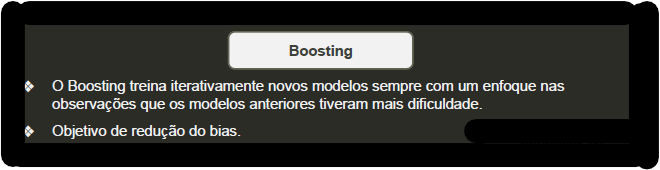

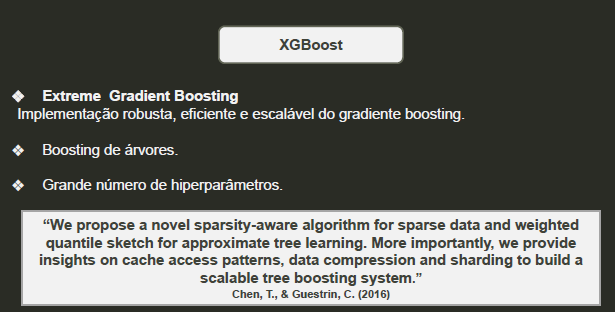

---
* Random Forest
---

> Grid Search para encontrar o melhor modelo

In [ ]:
params_grid = {
          'n_estimators':(10,50,75,100,250,500),
          'criterion':('gini','entropy'),
          'max_depth':(None,1,5,10,25,50,75,100)} #reduzimos os parâmetros para não deixar o GridSearch muito pesado e para reduzir o tempo de processamento

In [ ]:
from sklearn.ensemble import RandomForestClassifier #https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
# Create a based model
clf_RandomForest = RandomForestClassifier()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=clf_RandomForest, param_grid=params_grid, n_jobs=-1, cv=3, verbose=0)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ('gini', 'entropy'),
                         'max_depth': (None, 1, 5, 10, 25, 50, 75, 100),
                         'n_estimators': (10, 50, 75, 100, 250, 500)})

In [ ]:
print(grid_search.best_params_)
print(grid_search.best_estimator_)

{'criterion': 'entropy', 'max_depth': None, 'n_estimators': 75}
RandomForestClassifier(criterion='entropy', n_estimators=75)


> Modelo Específico

In [ ]:
clf_RandomForest = RandomForestClassifier(criterion='entropy',n_estimators=75)
clf_RandomForest.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', n_estimators=75)

>> Vizualização da Floresta

In [ ]:
# One of the coolest parts of the Random Forest implementation in Skicit-learn
# is we can actually examine any of the trees in the forest. We will select one tree,
# and save the whole tree as an image. The following code takes one tree from the
# forest and saves it as an image.

# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull out one tree from the forest
tree = clf_RandomForest.estimators_[5]
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull out one tree from the forest
tree = clf_RandomForest.estimators_[5]
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', feature_names = list(X.columns), rounded = True, precision = 1)
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')
# Write graph to a png file
graph.write_png('tree.png')

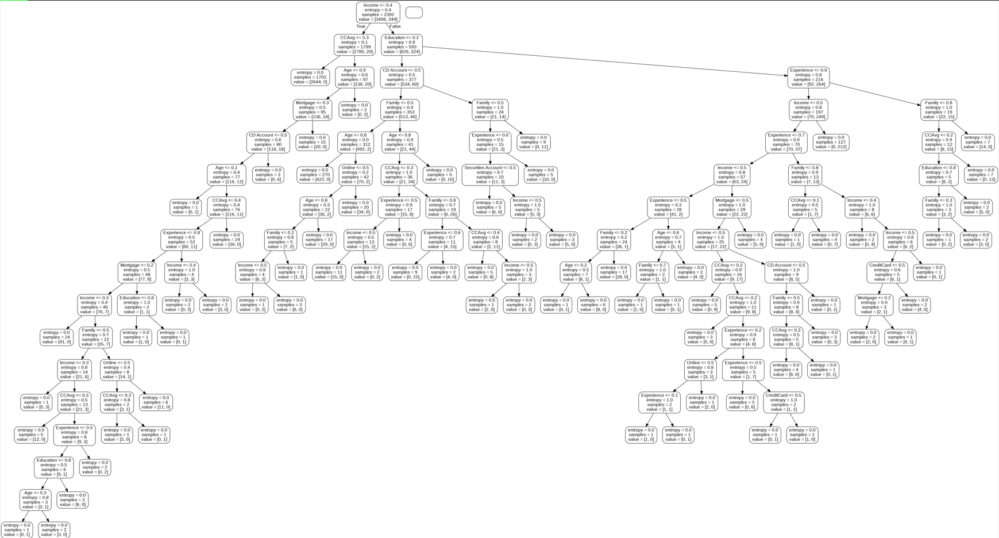

In [ ]:
y_pred = clf_RandomForest.predict(X_test)
y_pred

array([0, 1, 0, ..., 0, 0, 0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0e314b4d90>,
      dtype=object)

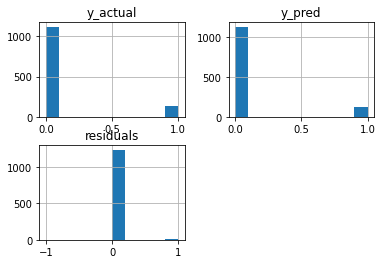

In [ ]:
pd.DataFrame({'y_actual':y_test,
              'y_pred':y_pred,
              'residuals':y_test - y_pred}).hist()

In [ ]:
f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

metricas["Random_Forest"]={"accuracy":accuracy,
                           "precision":precision,
                           "recall":recall,
                           "f1":f1}

F1 Score: 96.95%
Accuracy Score: 98.88%
Precision Score: 99.18%
Recall Score: 90.3%


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


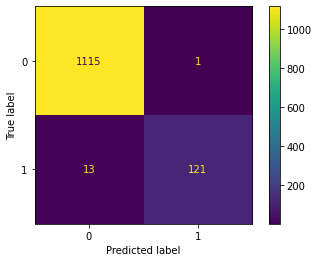

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf_RandomForest, X_test, y_test, values_format='d')  
plt.grid(False)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1116
           1       0.99      0.90      0.95       134

    accuracy                           0.99      1250
   macro avg       0.99      0.95      0.97      1250
weighted avg       0.99      0.99      0.99      1250



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


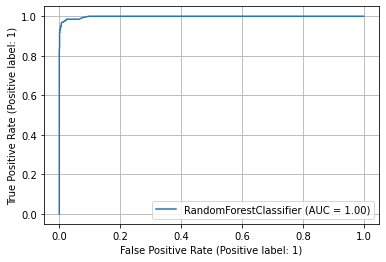

In [ ]:
from sklearn.metrics import plot_roc_curve

# Curva ROC
plot_roc_curve(clf_RandomForest, X_test, y_test)  
plt.grid(True)
plt.show()

Como o Gradient Boosting e o XGboost performam de modo similar a um algoritmo de Random Forest, não iremos aplicar um Grid Search e aproveitaremos os hiperparâmetros anteriores

---
* Gradient Boosting
---

> Modelo Específico

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier #https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html
clf_gradient_boosting = GradientBoostingClassifier(n_estimators=75, subsample=0.5)
clf_gradient_boosting.fit(X_train,y_train)

GradientBoostingClassifier(n_estimators=75, subsample=0.5)

In [ ]:
y_pred = clf_gradient_boosting.predict(X_test)
y_pred

array([0, 1, 0, ..., 0, 0, 0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0e325c7910>,
      dtype=object)

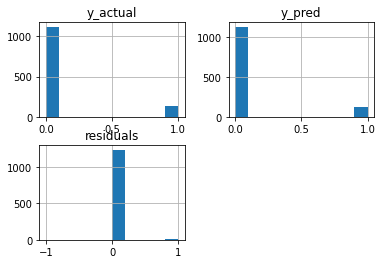

In [ ]:
pd.DataFrame({'y_actual':y_test,
              'y_pred':y_pred,
              'residuals':y_test - y_pred}).hist()

In [ ]:
f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

metricas["Gradient_Boosting"]={"accuracy":accuracy,
                               "precision":precision,
                               "recall":recall,
                               "f1":f1}

F1 Score: 96.77%
Accuracy Score: 98.8%
Precision Score: 97.6%
Recall Score: 91.04%


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


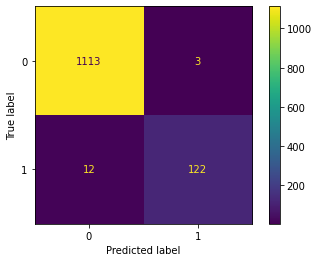

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf_gradient_boosting, X_test, y_test, values_format='d')  
plt.grid(False)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1116
           1       0.98      0.91      0.94       134

    accuracy                           0.99      1250
   macro avg       0.98      0.95      0.97      1250
weighted avg       0.99      0.99      0.99      1250



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


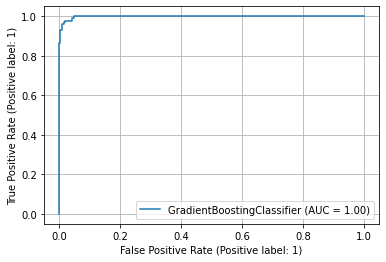

In [ ]:
from sklearn.metrics import plot_roc_curve

# Curva ROC
plot_roc_curve(clf_gradient_boosting, X_test, y_test)  
plt.grid(True)
plt.show()

---
* XGboost
---

> Modelo Específico

In [ ]:
from xgboost import XGBClassifier #https://github.com/dmlc/xgboost
clf_xgb = XGBClassifier(n_estimators=75, max_depth=10)
clf_xgb.fit(X_train,y_train)

XGBClassifier(max_depth=10, n_estimators=75)

In [ ]:
y_pred = clf_xgb.predict(X_test)
y_pred

array([0, 1, 0, ..., 0, 0, 0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0e31d283d0>,
      dtype=object)

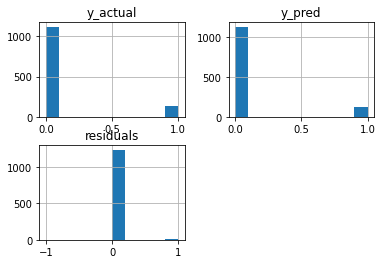

In [ ]:
pd.DataFrame({'y_actual':y_test,
              'y_pred':y_pred,
              'residuals':y_test - y_pred}).hist()

In [ ]:
f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

metricas["XGboost"]={"accuracy":accuracy,
                               "precision":precision,
                               "recall":recall,
                               "f1":f1}

F1 Score: 97.18%
Accuracy Score: 98.96%
Precision Score: 99.19%
Recall Score: 91.04%


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


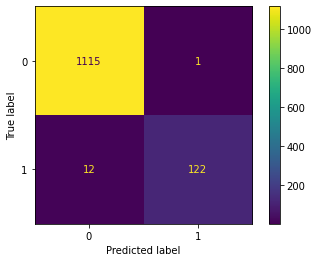

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf_xgb, X_test, y_test, values_format='d')  
plt.grid(False)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1116
           1       0.99      0.91      0.95       134

    accuracy                           0.99      1250
   macro avg       0.99      0.95      0.97      1250
weighted avg       0.99      0.99      0.99      1250



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


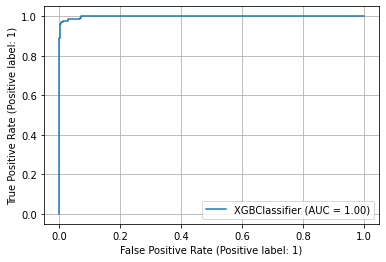

In [ ]:
from sklearn.metrics import plot_roc_curve

# Curva ROC
plot_roc_curve(clf_xgb, X_test, y_test)  
plt.grid(True)
plt.show()

#### f) Support Vector Machine (SVM)

Características Gerais:

- SVM é um classificador que procura encontrar o melhor hiperplano para separar duas classes;
- Pode ser utilizado em dados que não estejam separados linearmente devido sua variação do Kernel;
- A resposta do modelo é dificilmente interpretável, o que é retornado não é diretamente uma probabilidade;
- Método baseado em distância: recomendado normalizar os dados de entrada;
- SVM Multiclass pode ser implementado com técnicas de *one-versus-one* ou *one-versus-rest*;

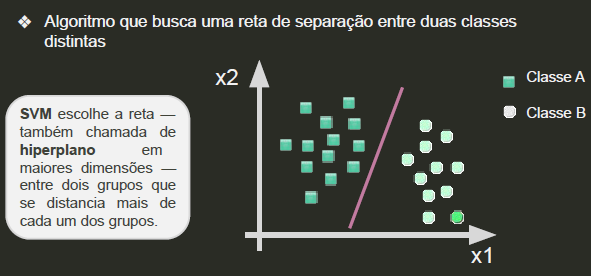

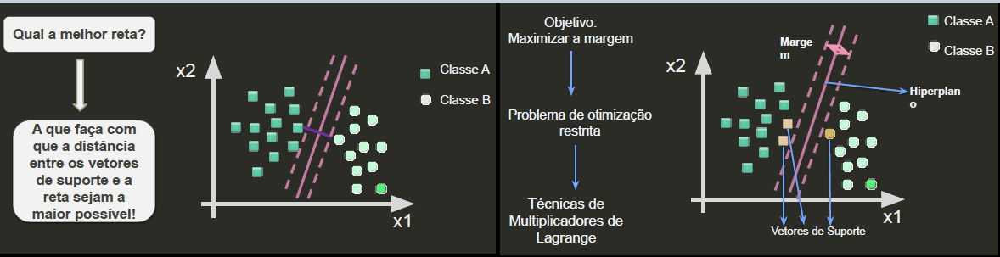

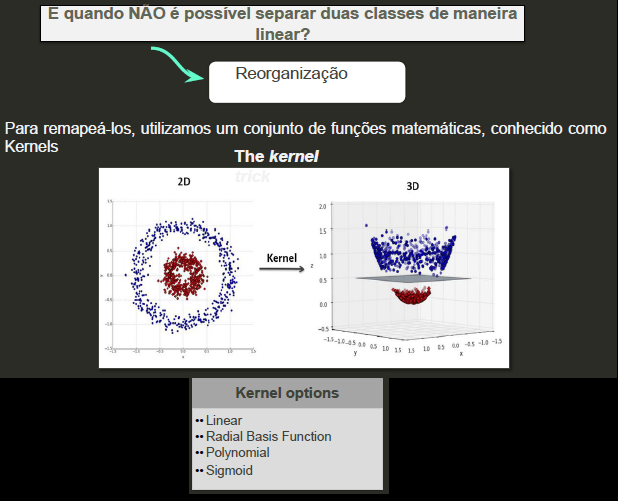

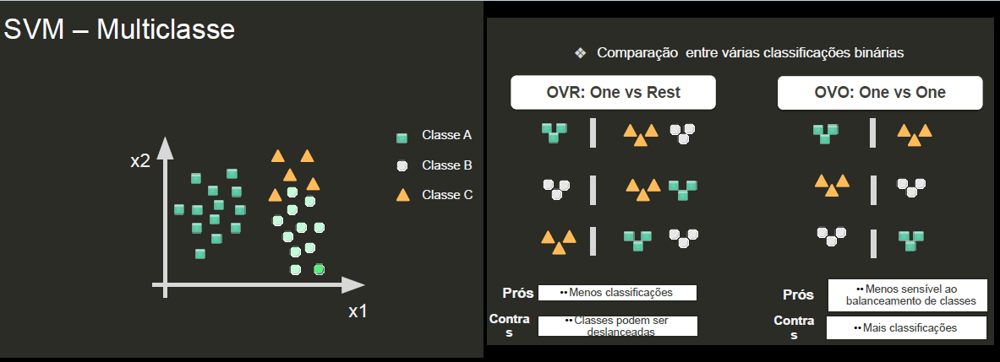

> Grid Search para encontrar o melhor modelo

Como nossa classificação é binária, não iremos passar para nosso grid os parâmetros relativos a OVR e OVO

In [ ]:
params_grid = {
              'kernel': ('linear','poly','rbf','sigmoid'), 
              'degree':(3,5,7),
              'probability':(True,False)
}

In [ ]:
from sklearn.svm import SVC #https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
# Create a based model
cls_SVM = SVC()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=cls_SVM, param_grid=params_grid, n_jobs=-1, cv=3, verbose=0)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=SVC(), n_jobs=-1,
             param_grid={'degree': (3, 5, 7),
                         'kernel': ('linear', 'poly', 'rbf', 'sigmoid'),
                         'probability': (True, False)})

In [ ]:
print(grid_search.best_params_)
print(grid_search.best_estimator_)

{'degree': 3, 'kernel': 'poly', 'probability': True}
SVC(kernel='poly', probability=True)


> Modelo Específico

In [ ]:
clf_SVM = SVC(kernel='poly',degree=3,probability=True)
clf_SVM.fit(X_train,y_train)

SVC(kernel='poly', probability=True)

In [ ]:
y_pred = clf_SVM.predict(X_test)
y_pred

array([0, 1, 0, ..., 0, 0, 0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0e31acd450>,
      dtype=object)

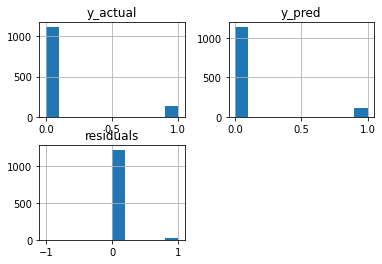

In [ ]:
pd.DataFrame({'y_actual':y_test,
              'y_pred':y_pred,
              'residuals':y_test - y_pred}).hist()

In [ ]:
f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

metricas["SVM"]={"accuracy":accuracy,
                 "precision":precision,
                 "recall":recall,
                 "f1":f1}

F1 Score: 93.94%
Accuracy Score: 97.84%
Precision Score: 97.35%
Recall Score: 82.09%


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


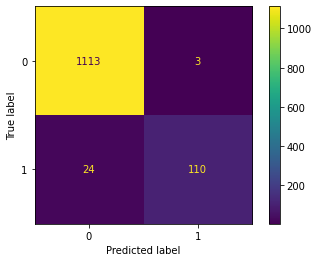

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(clf_SVM, X_test, y_test, values_format='d')  
plt.grid(False)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1116
           1       0.97      0.82      0.89       134

    accuracy                           0.98      1250
   macro avg       0.98      0.91      0.94      1250
weighted avg       0.98      0.98      0.98      1250



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


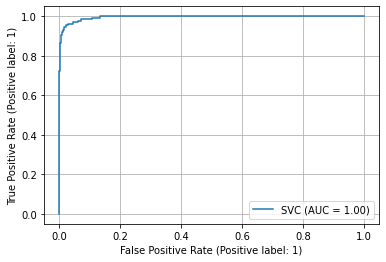

In [ ]:
from sklearn.metrics import plot_roc_curve

# Curva ROC
plot_roc_curve(clf_SVM, X_test, y_test)  
plt.grid(True)
plt.show()

#### g) Artificial Neural Networks

Características Gerais:

- Redes Neurais são capazes de solucionar problemas não-lineares;
- Perceptron é a unidade básica das redes neurais;
- Funções de ativação são funções não-lineares aplicadas diretamente no potencial de ativação e são geradas pela somatória ponderada das entradas de um neurônio;
- Treinamento da rede significa encontrar os menores valores do peso (weight) e do viés (bias) para minimizar a função de perda;
- Método de backpropagation é a técnica mais usual para treinar redes neurais e utiliza o método do Gradient-Descent para direcionar as atualizações dos pesos e bias da rede;
- Redes neurais profundas podem extrair features dos dados de maneira automática;
- Treinamento de redes profundas é, de forma geral, mais custoso computacionalmente;
- Redes neurais são sensíveis à escala dos dados - Necessário aplicar a normalização;


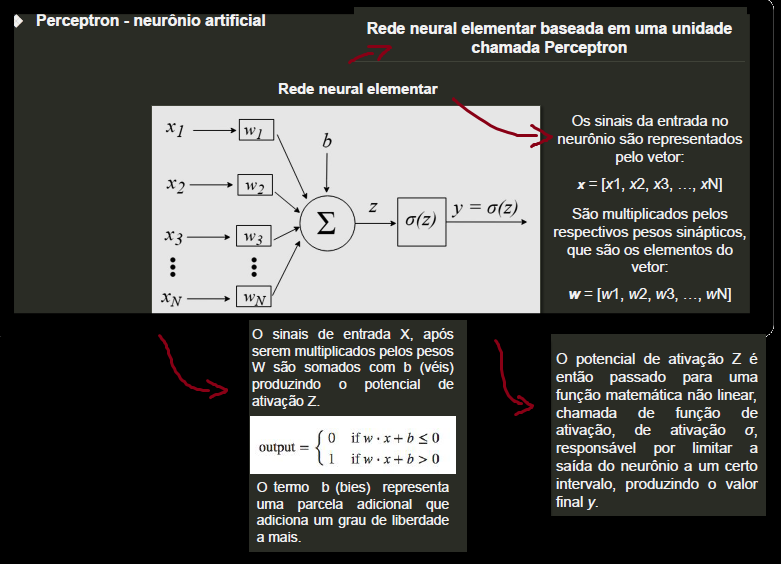

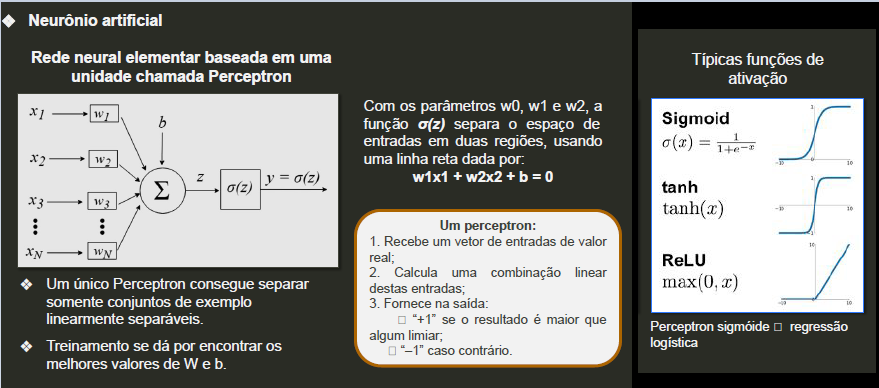

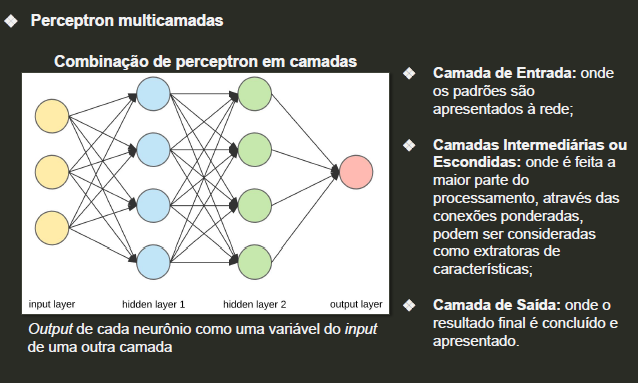

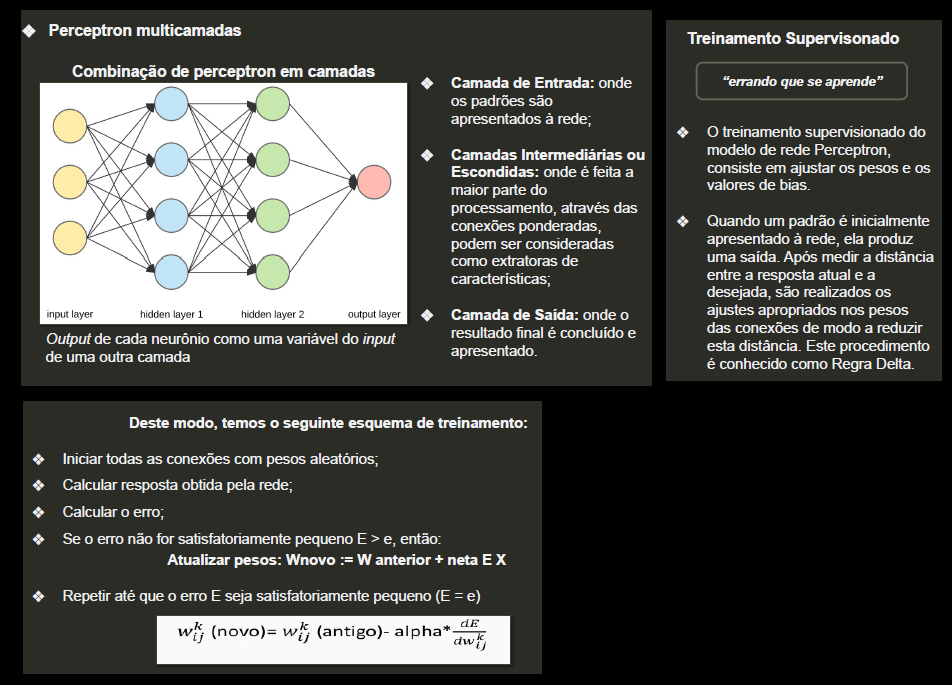

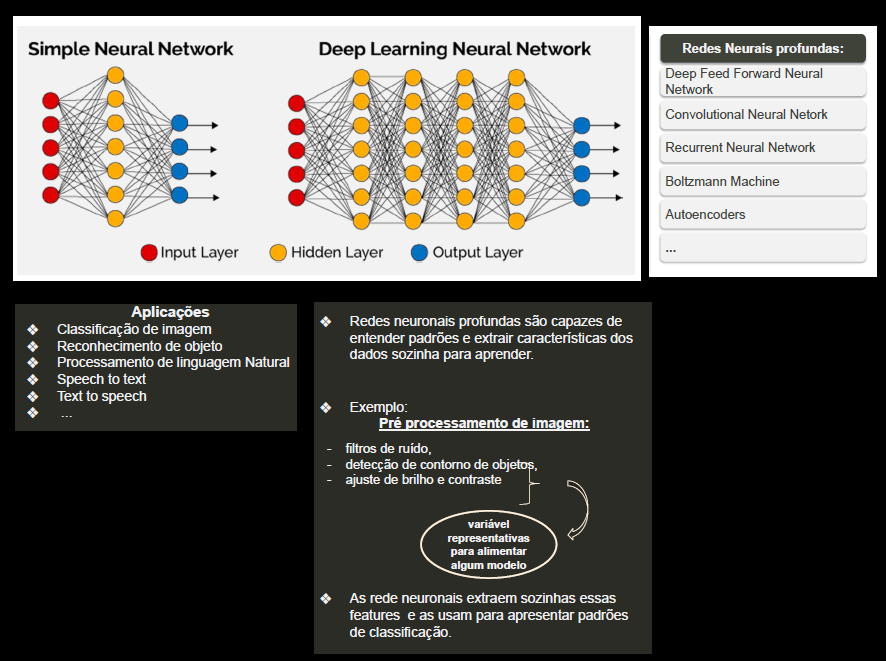

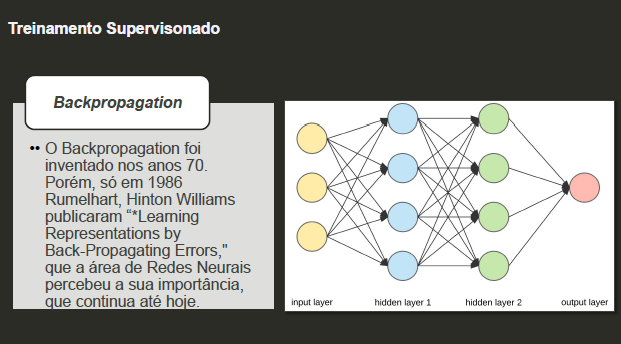

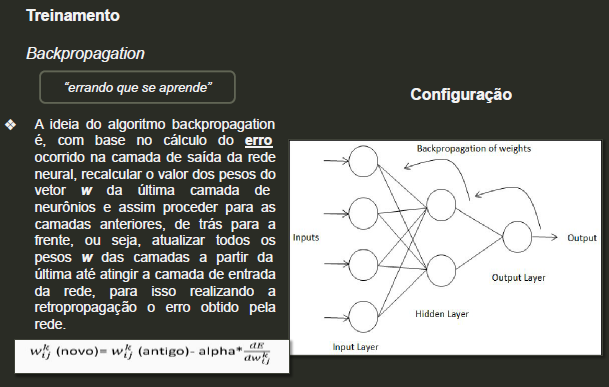

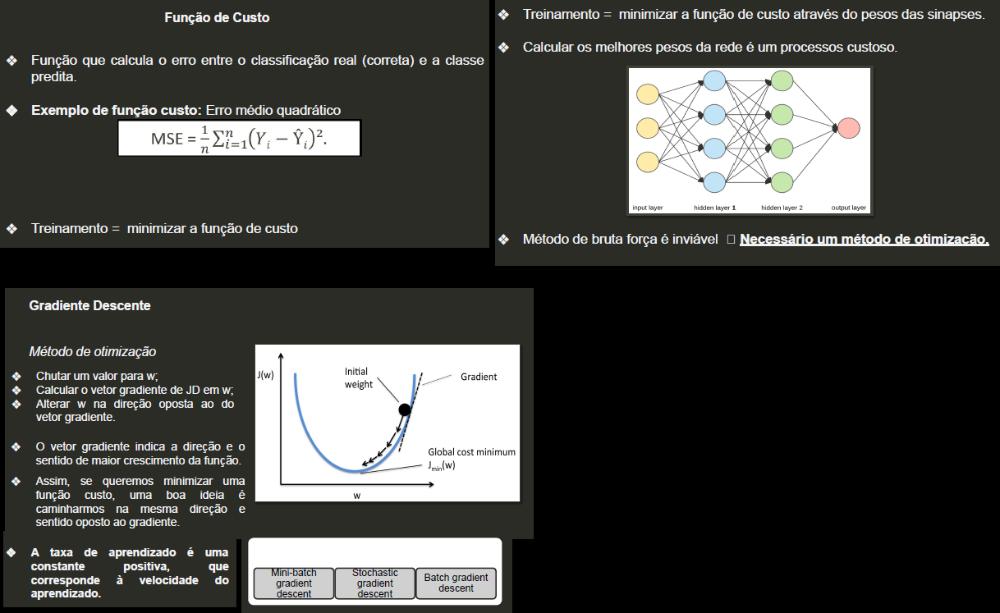

> Grid Search para encontrar o melhor modelo

In [ ]:
params_grid = {
              'activation':('identity','logistic','tanh','relu'),
              'solver':('lbfgs','sgd','adam'),
              'learning_rate':('constant','invscaling','adaptative'),
              'momentum':(0.1,0.5,0.9)
}

In [ ]:
from sklearn.neural_network import MLPClassifier #https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html
# Create a based model
cls_Neural_MLP = MLPClassifier()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=cls_Neural_MLP, param_grid=params_grid, n_jobs=-1, cv=3, verbose=0)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
108 fits failed out of a total of 324.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
108 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py", line 752, in fit
    return self._fit(X, y, incremental=False)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py", line 384, in _fit
    self._validate_hyperparameters()
 

GridSearchCV(cv=3, estimator=MLPClassifier(), n_jobs=-1,
             param_grid={'activation': ('identity', 'logistic', 'tanh', 'relu'),
                         'learning_rate': ('constant', 'invscaling',
                                           'adaptative'),
                         'momentum': (0.1, 0.5, 0.9),
                         'solver': ('lbfgs', 'sgd', 'adam')})

In [ ]:
print(grid_search.best_params_)
print(grid_search.best_estimator_)

{'activation': 'relu', 'learning_rate': 'constant', 'momentum': 0.1, 'solver': 'adam'}
MLPClassifier(momentum=0.1)


> Modelo Específico

In [ ]:
cls_Neural_MLP = MLPClassifier(activation='relu',learning_rate='constant',
                               momentum=0.1,solver='adam',hidden_layer_sizes=(100, 50, 10),max_iter=1000)

cls_Neural_MLP.fit(X_train,y_train)

MLPClassifier(hidden_layer_sizes=(100, 50, 10), max_iter=1000, momentum=0.1)

In [ ]:
# Visualização da Rede com ANN Visualizer: compatível apenas com objetos do Keras (https://towardsdatascience.com/visualizing-artificial-neural-networks-anns-with-just-one-line-of-code-b4233607209e)

# !pip3 install ann_visualizer

# from ann_visualizer.visualize import ann_viz

# ann_viz(cls_Neural_MLP, title="My first neural network")

  Created wheel for ann-visualizer: filename=ann_visualizer-2.5-py3-none-any.whl size=4168 sha256=ff25a20f8ff62221940181deb7684896aa7cf2060aa540de7375463047165089
  Stored in directory: /root/.cache/pip/wheels/1b/fc/58/2ab1c3b30350105929308becddda4fb59b1358e54f985e1f4a
Successfully built ann-visualizer


In [ ]:
y_pred = cls_Neural_MLP.predict(X_test)
y_pred

array([0, 1, 0, ..., 0, 0, 0])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f0e31ea7fd0>,
      dtype=object)

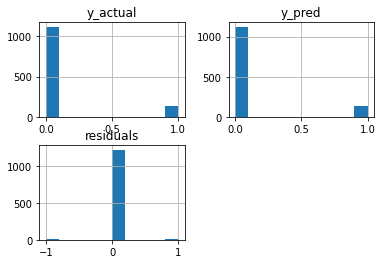

In [ ]:
pd.DataFrame({'y_actual':y_test,
              'y_pred':y_pred,
              'residuals':y_test - y_pred}).hist()

In [ ]:
f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

metricas["Neural_Network_MLP"]={"accuracy":accuracy,
                                "precision":precision,
                                "recall":recall,
                                "f1":f1}

F1 Score: 94.92%
Accuracy Score: 98.08%
Precision Score: 92.31%
Recall Score: 89.55%


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


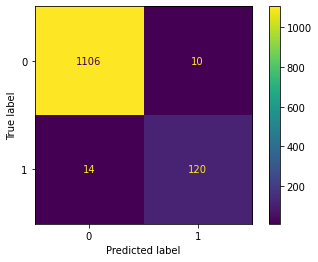

In [ ]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(cls_Neural_MLP, X_test, y_test, values_format='d')  
plt.grid(False)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1116
           1       0.92      0.90      0.91       134

    accuracy                           0.98      1250
   macro avg       0.96      0.94      0.95      1250
weighted avg       0.98      0.98      0.98      1250



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


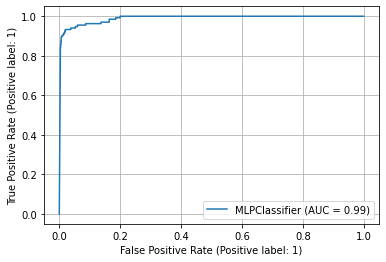

In [ ]:
from sklearn.metrics import plot_roc_curve

# Curva ROC
plot_roc_curve(cls_Neural_MLP, X_test, y_test)  
plt.grid(True)
plt.show()

#### h) Tunning de Hiperparâmetros

Características Gerais:

- O processo de tunning consiste em encontrar os parâmetros ótimos de um classificador;
- Analisar implementações semelhantes na literatura e iniciar pelos parâmetros já conhecidos é uma boa prática;
- As técnicas mais frequentes de tunning de classificadores são: Random Search, Grid Search e Bayes Search;
- No geral, o processo de refinamento do modelo pode exigir voltar na etapa de data preparation e seleção de variáveis;

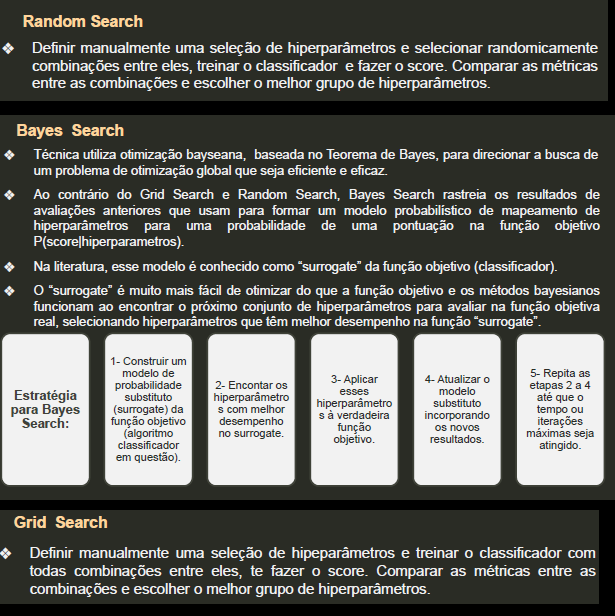

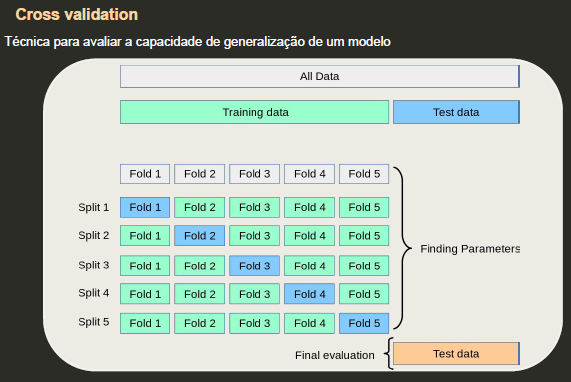

Referências: https://machinelearningmastery.com/scikit-optimize-for-hyperparameter-tuning-in-machine-learning/

Até o momento utilizamos para todos os modelos o Grid Search afim de encontrar os hiperparâmetros ótimos. Manteremos as abordagens anteriores e nesta seção, em especial, iremos utilzar o Bayes Search apenas para fins didáticos. O modelo será arbitrariamente escolhido sem a necessidade de substituição das métricas já avaliadas anteriormente

In [ ]:
!pip install scikit-optimize

     |████████████████████████████████| 100 kB 5.7 MB/s 


> Testando o Bayes Search sobre um classificador do tipo Random Forest

In [ ]:
from skopt import BayesSearchCV

params_grid = {
    "n_estimators":[100, 150, 200],
    "criterion":["gini", "entropy"],
    "max_depth":[None, 4, 5],
    "min_samples_split":[2, 3, 4],
    "max_features":[3, 5, 8],
    "bootstrap":[False, True]
}

In [ ]:
clf = RandomForestClassifier()

bayes_search = BayesSearchCV(clf, search_spaces=params_grid, cv=3, n_jobs=1,verbose=2)
bayes_search.fit(X_train, y_train)

Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, n_estimators=150; total time=   1.2s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, n_estimators=150; total time=   1.4s
[CV] END bootstrap=False, criterion=gini, max_depth=4, max_features=5, min_samples_split=3, n_estimators=150; total time=   1.5s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=8, min_samples_split=2, n_estimators=150; total time=   1.8s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=8, min_samples_split=2, n_estimators=150; total time=   1.5s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=8, min_samples_split=2, n_estimators=150; total time=   1.8s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV] END bootstrap=True, criterion=entropy, max_dept

BayesSearchCV(cv=3, estimator=RandomForestClassifier(),
              search_spaces={'bootstrap': [False, True],
                             'criterion': ['gini', 'entropy'],
                             'max_depth': [None, 4, 5],
                             'max_features': [3, 5, 8],
                             'min_samples_split': [2, 3, 4],
                             'n_estimators': [100, 150, 200]},
              verbose=2)

In [ ]:
bayes_best = bayes_search.best_estimator_
bayes_best

RandomForestClassifier(bootstrap=False, max_features=3, n_estimators=150)

In [ ]:
y_pred = bayes_best.predict(X_test)
y_pred

array([0, 1, 0, ..., 0, 0, 0])

In [ ]:
f1 = round(f1_score(y_test, y_pred, average='macro')*100, 2)
accuracy = round(accuracy_score(y_test, y_pred)*100,2)
precision = round(precision_score(y_test, y_pred)*100,2)
recall = round(recall_score(y_test, y_pred)*100,2)

print(f"F1 Score: {f1}%")
print(f"Accuracy Score: {accuracy}%")
print(f"Precision Score: {precision}%")
print(f"Recall Score: {recall}%")

F1 Score: 97.41%
Accuracy Score: 99.04%
Precision Score: 99.19%
Recall Score: 91.79%


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1116
           1       0.99      0.92      0.95       134

    accuracy                           0.99      1250
   macro avg       0.99      0.96      0.97      1250
weighted avg       0.99      0.99      0.99      1250



#### i) Interpretabilidade de um Classificador

Características Gerais:

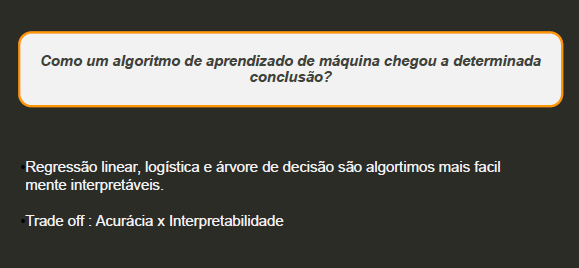

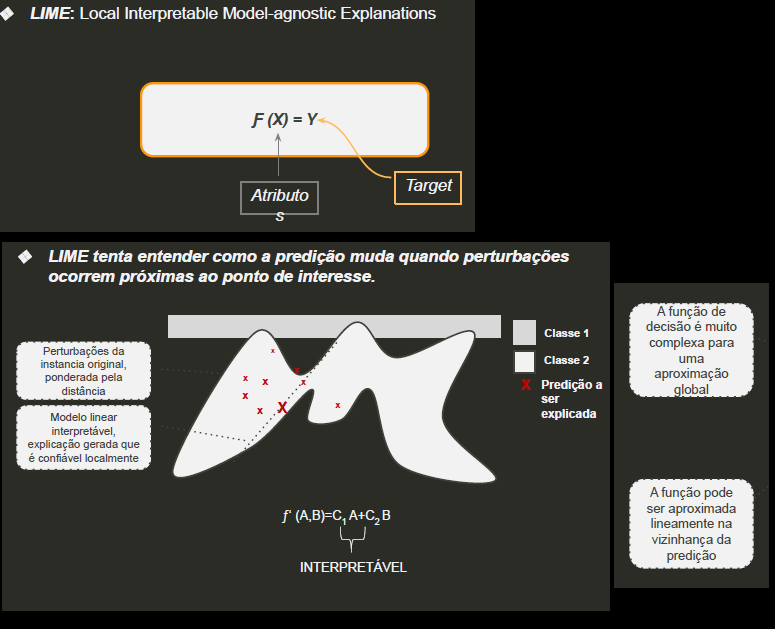

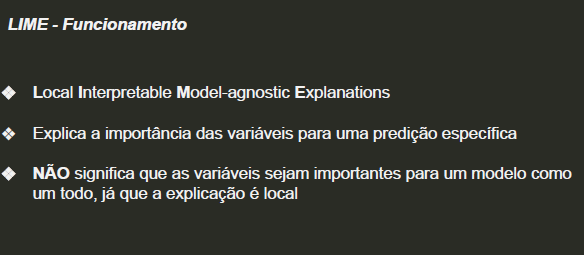

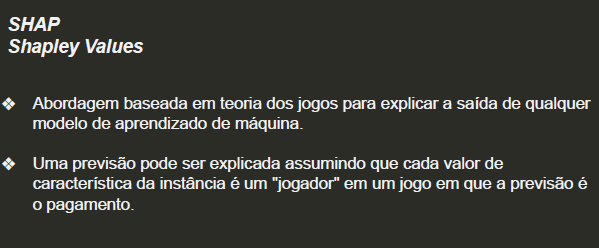

Como estamos interessados na interpretabilidade de um modelo, iremos aproveitar arbitrariamente um classificador já mensurado nas etapas anteriores

In [ ]:
!pip install lime

     |████████████████████████████████| 275 kB 20.1 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=e92448d247139f3f63c6c19a6cdd5ee5ebba88005de4a98e7cac0e188116523c
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
import lime  #Doc: https://github.com/marcotcr/lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train),
                                                   feature_names=X_train.columns,
                                                   class_names=["Normal", "Suspect", "Pathologic"],
                                                   mode='classification')

exp = explainer.explain_instance(X_test.iloc[25],
                                 cls_Neural_MLP.predict_proba,
                                 num_features=8,
                                 top_labels=1)

exp.show_in_notebook(show_table=True, show_all=False)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  "X does not have valid feature names, but"


In [ ]:
print('X_test Arbitrário:\n',X_test.iloc[25])

X_test Arbitrário:
 Age                   0.613636
Experience            0.630435
Income                0.143519
Family                0.666667
CCAvg                 0.190000
Education             0.500000
Mortgage              0.000000
Securities Account    0.000000
CD Account            0.000000
Online                1.000000
CreditCard            0.000000
Name: 25, dtype: float64


#### j) Resumo dos classificadores

In [ ]:
df_classifiers = pd.DataFrame.from_dict(metricas, orient='index')
df_classifiers

,accuracy,precision,recall,f1
KNN,96.08,97.75,64.93,87.94
Logistic_Regression,95.04,85.29,64.93,85.50
Gaussian_NB,89.20,49.70,61.94,74.51
Decision_Tree,98.48,97.52,88.06,95.85
Random_Forest,98.88,99.18,90.30,96.95
Gradient_Boosting,98.80,97.60,91.04,96.77
XGboost,98.96,99.19,91.04,97.18
SVM,97.84,97.35,82.09,93.94
Neural_Network_MLP,98.08,92.31,89.55,94.92


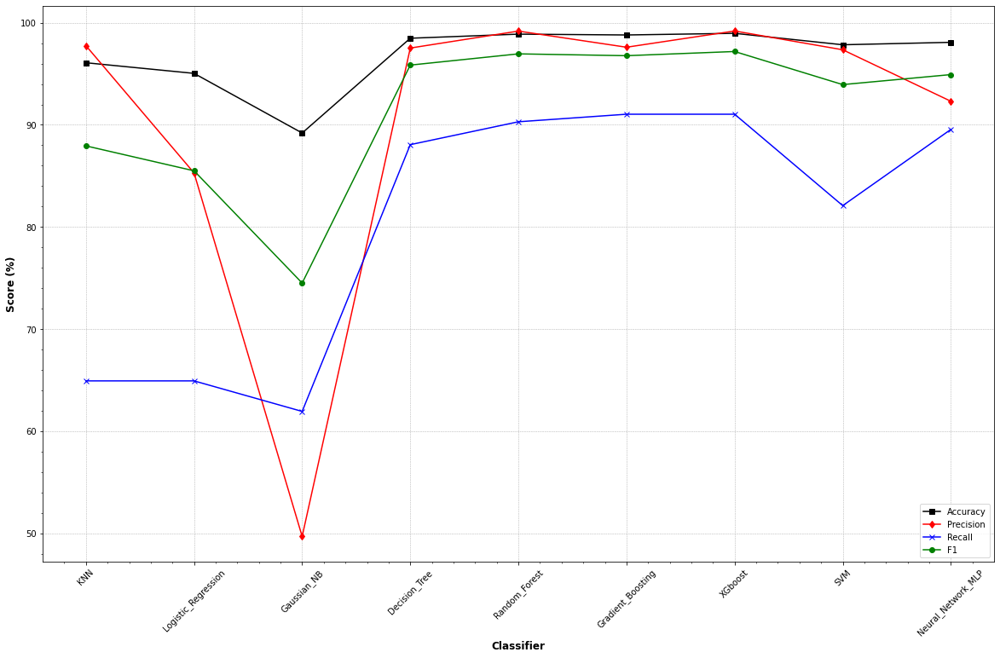

In [ ]:
plt.figure(figsize=(20,12))

plt.plot(df_classifiers.accuracy,'-sk')
plt.plot(df_classifiers.precision,'-dr')
plt.plot(df_classifiers.recall,'-xb')
plt.plot(df_classifiers.f1,'-og')

plt.xlabel('Classifier',fontsize=12,weight='bold')
plt.xticks(rotation=45)
plt.ylabel('Score (%)',fontsize=12,weight='bold')
plt.legend(('Accuracy','Precision','Recall','F1'),loc='lower right')

plt.grid(True, linestyle='--', linewidth=0.5, which='major')
plt.minorticks_on()

plt.show()

De uma forma bastante visual podemos perceber que as melhores métricas foram atingidas para o nosso algoritmo XGboost. Entretanto é válido mencionar que ele não representa o melhor algoritmo global de classificação. Este conceito não existe, pois cada caso é um caso a parte. O comportamento dos dados e as relações entre cada Feature vai exigir um algoritmo em específico.

Além disso, este foi um processo bastante artesanal (salvo pelo uso do Grid Search), em que a implementação manual nos deu liberdade para compararmos as diferentes métricas para cada algoritmo. Num caso real, em que se prioriza o tempo, talvez seguir por referências que já estão implementadas ou até mesmo utilizar um Auto-ML seria mais adequado.